In [2]:
!pip install torch_geometric scipy

import os
import time
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv
from torch_geometric.utils import to_networkx
from scipy.stats import ttest_rel

torch.manual_seed(42)
np.random.seed(42)



[notice] A new release of pip is available: 24.2 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip
c:\Users\emma.sleghel\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
def load_graph_from_file(file_path):
    edges = []
    with open(file_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) == 3 and parts[0] == 'e':
                v1, v2 = int(parts[1]), int(parts[2])
                edges.append([v1-1, v2-1])
    if edges:
        edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()
        edge_index_reverse = torch.stack([edge_index[1], edge_index[0]], dim=0)
        edge_index = torch.cat([edge_index, edge_index_reverse], dim=1)
        num_nodes = edge_index.max().item() + 1
    else:
        edge_index = torch.tensor([], dtype=torch.long).reshape(2, 0)
        num_nodes = 0
    return edge_index, num_nodes

def create_pyg_data(edge_index, num_nodes):
    x = torch.eye(num_nodes, dtype=torch.float)
    data = Data(x=x, edge_index=edge_index)
    return data


## Enhanced Greedy Model: Greedy optimized



Greedy Optimized vs. Greedy

Greedy (basic):

Assigns colors to nodes in order of descending degree.
For each node, picks the smallest color not used by its neighbors.
Stops after the initial assignment; does not attempt to reduce the number of colors further.
Simple, fast, but may use more colors than necessary.


Greedy Optimized :

Starts with the same greedy coloring as above.
Then, iteratively tries to reduce the color of each node:
For each node, attempts to assign a lower color if it does not conflict with neighbors.
Repeats this process for a fixed number of iterations or until no further improvements are possible.
This local search step can reduce the total number of colors used, making the coloring more efficient.
Slightly more computationally intensive than basic greedy, but still very fast.



Greedy Optimized improves upon Greedy by adding a local search phase that reduces the number of colors after the initial assignment, leading to more efficient colorings.

In [ ]:
import random

def greedy_local_search_optimization(data, max_iter=1000):
    G = to_networkx(data, to_undirected=True)
    # Start with greedy coloring
    colors = {}
    nodes_by_degree = sorted(G.nodes(), key=lambda n: G.degree(n), reverse=True)
    for node in nodes_by_degree:
        neighbor_colors = {colors[neighbor] for neighbor in G.neighbors(node) if neighbor in colors}
        color = 0
        while color in neighbor_colors:
            color += 1
        colors[node] = color
    color_list = [colors[i] for i in range(len(G.nodes()))]
    num_colors = len(set(color_list))
    # Try to reduce the number of colors
    for _ in range(max_iter):
        improved = False
        for node in G.nodes():
            current_color = colors[node]
            for new_color in range(current_color):
                neighbor_colors = {colors[neighbor] for neighbor in G.neighbors(node)}
                if new_color not in neighbor_colors:
                    colors[node] = new_color
                    improved = True
                    break
            if improved:
                break
        if not improved:
            break
    color_list = [colors[i] for i in range(len(G.nodes()))]
    num_colors = len(set(color_list))
    return color_list, num_colors



Graph 1 - Greedy Local Search Optimization uses 213 colors in 1.9341 seconds


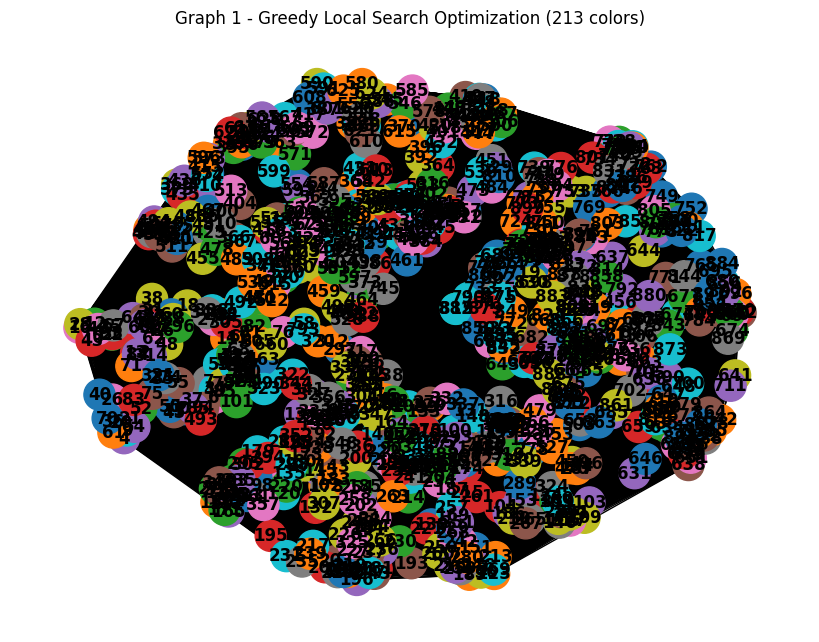

Graph 2 - Greedy Local Search Optimization uses 123 colors in 1.3218 seconds


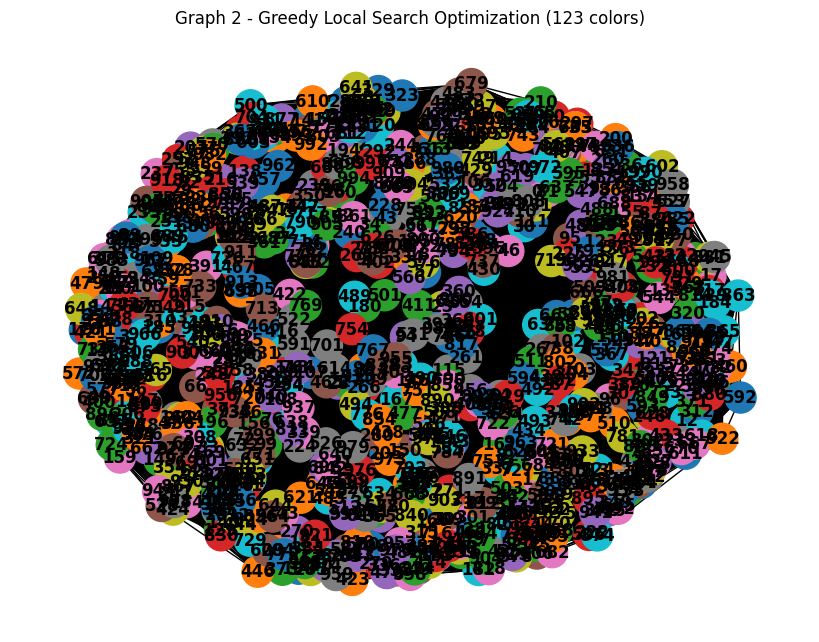

Graph 3 - Greedy Local Search Optimization uses 11 colors in 0.0010 seconds


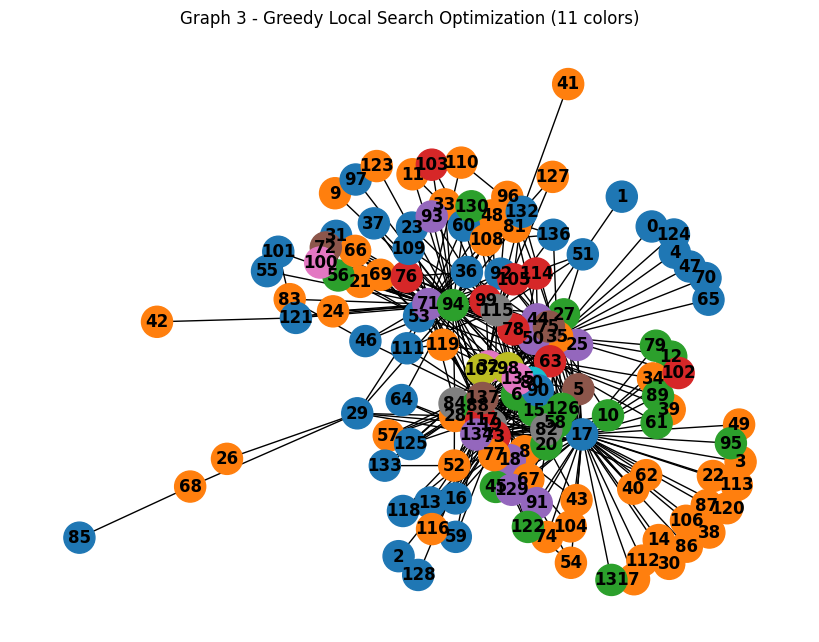

Graph 4 - Greedy Local Search Optimization uses 2 colors in 0.0332 seconds


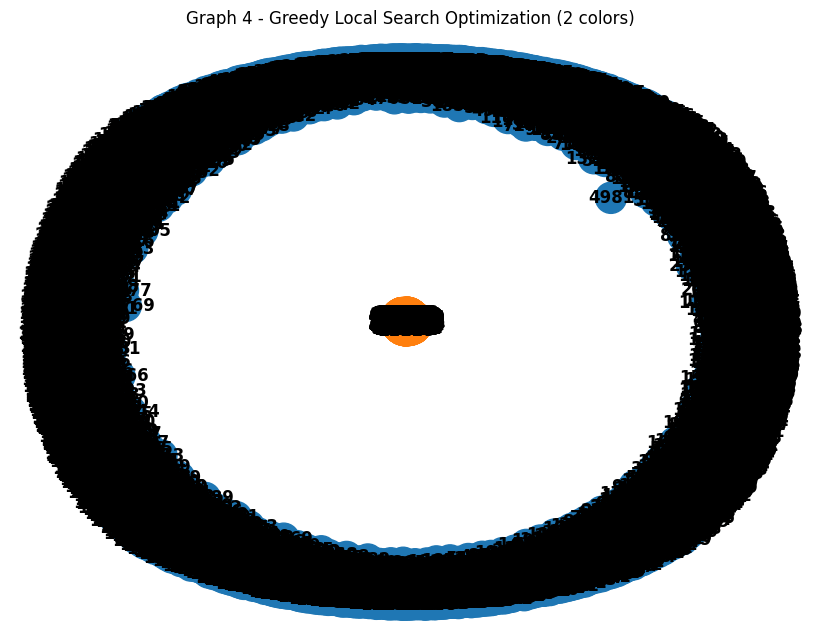

Graph 5 - Greedy Local Search Optimization uses 64 colors in 0.0090 seconds


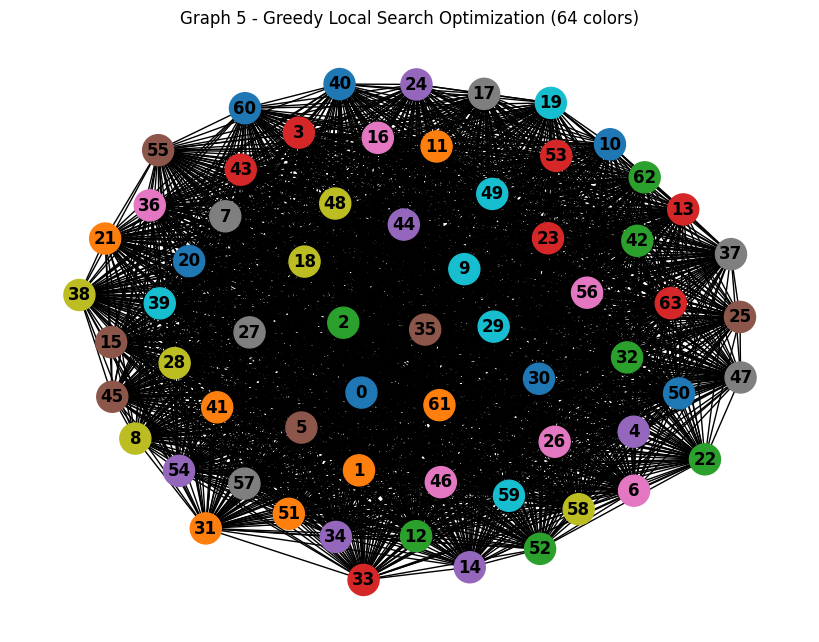

Graph 6 - Greedy Local Search Optimization uses 2 colors in 0.0000 seconds


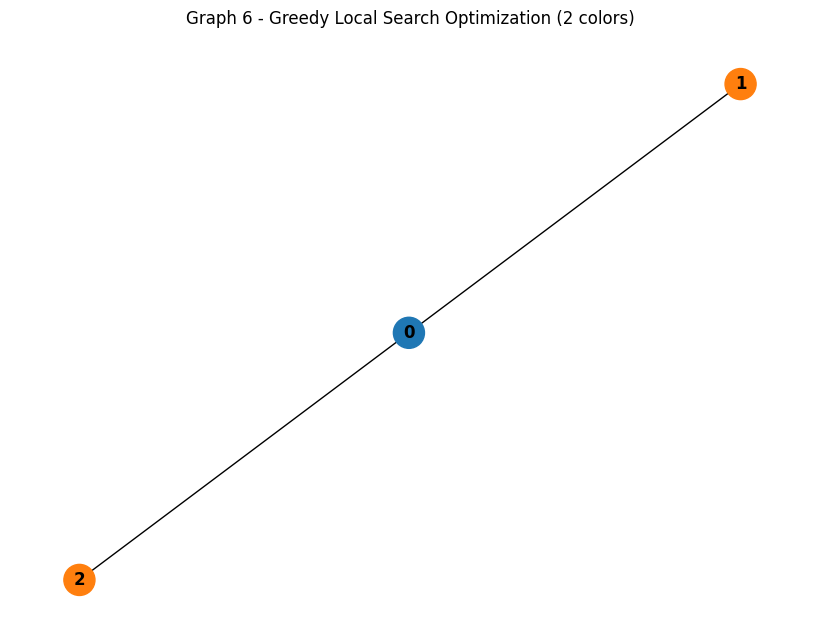

Graph 7 - Greedy Local Search Optimization uses 71 colors in 0.2222 seconds


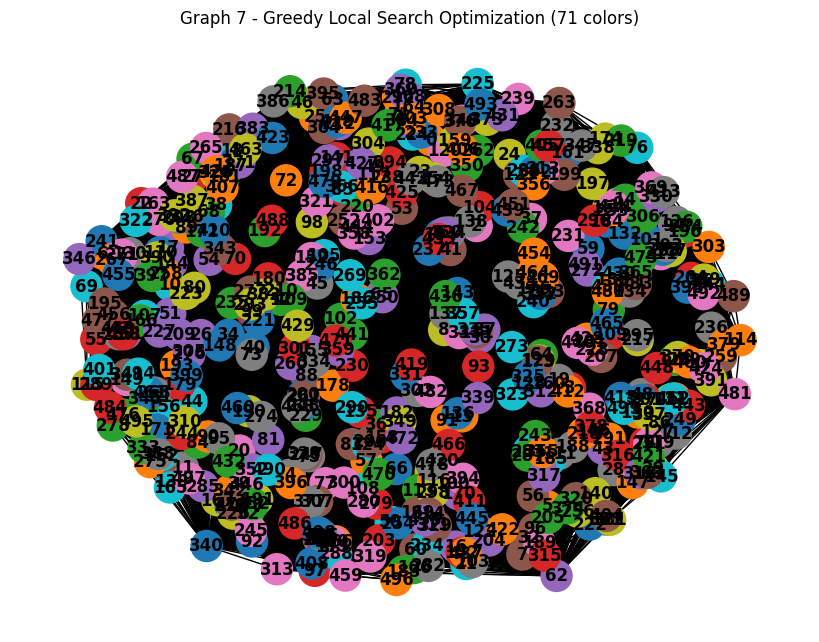

Graph 8 - Greedy Local Search Optimization uses 3 colors in 0.0020 seconds


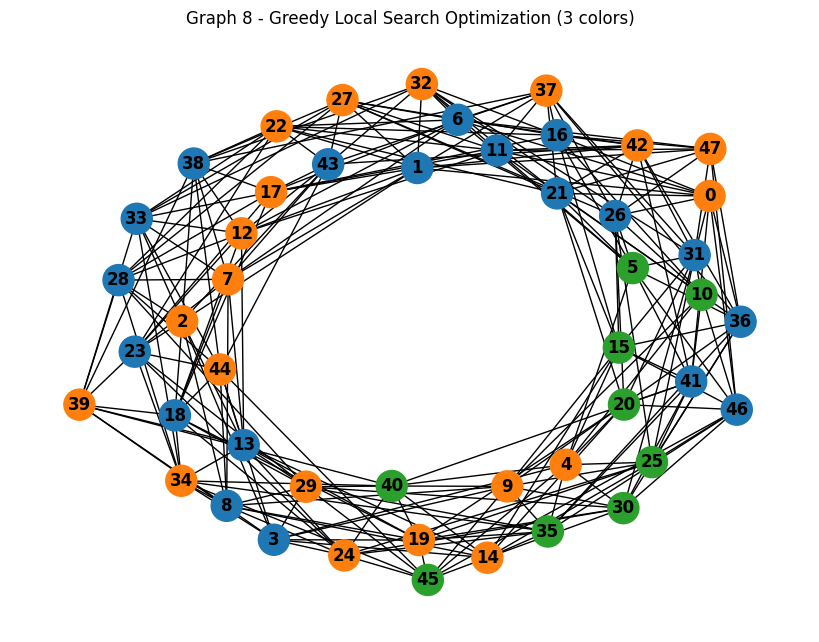

Graph 9 - Greedy Local Search Optimization uses 25 colors in 0.0000 seconds


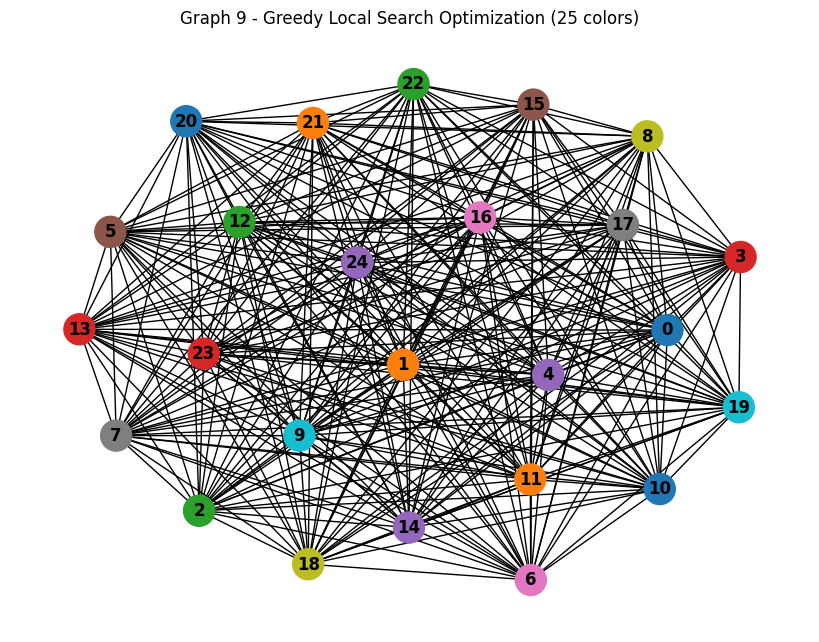

Graph 10 - Greedy Local Search Optimization uses 7 colors in 0.0010 seconds


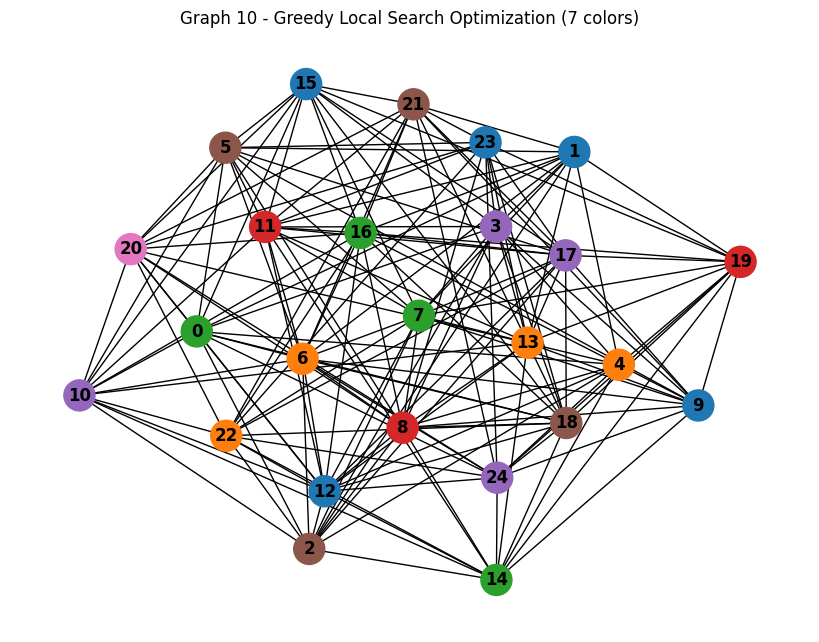

Graph 11 - Greedy Local Search Optimization uses 2 colors in 0.0000 seconds


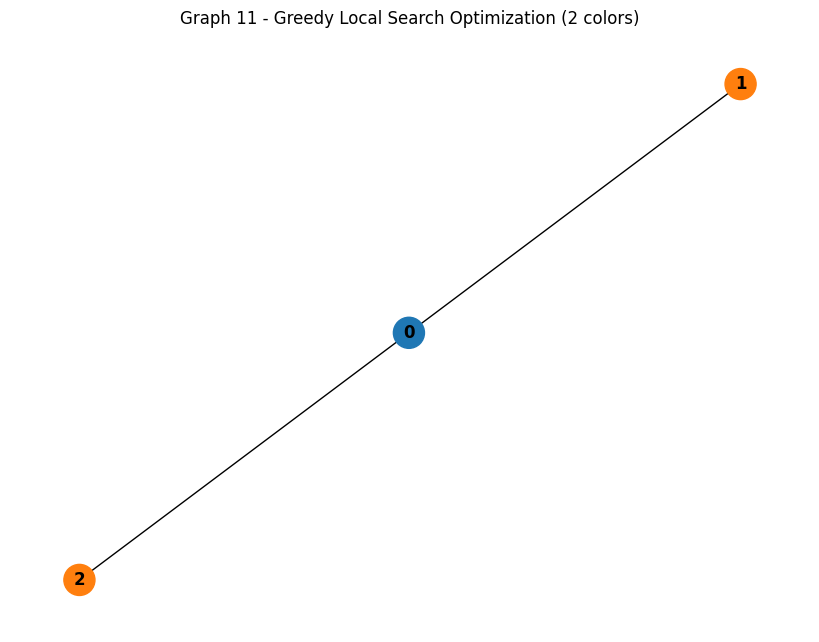

Graph 12 - Greedy Local Search Optimization uses 2 colors in 0.0000 seconds


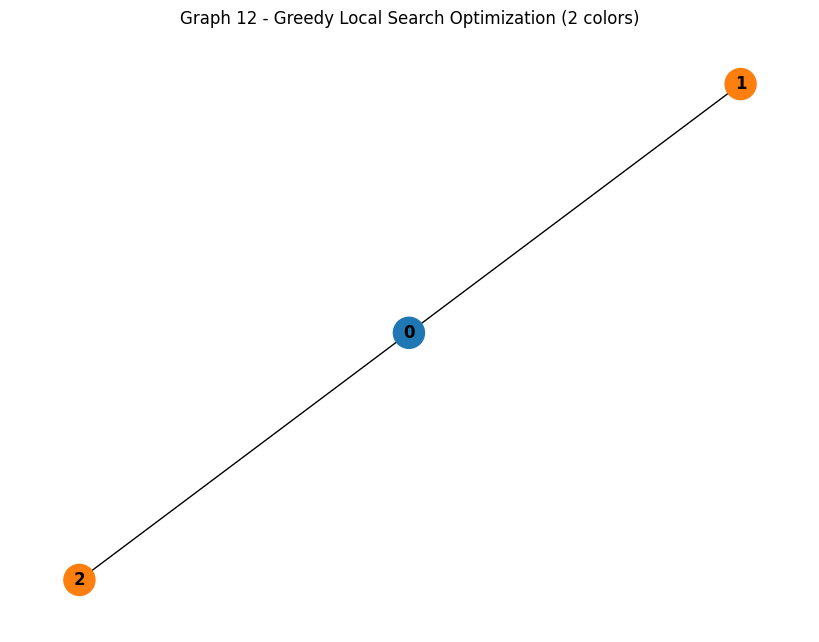

Graph 13 - Greedy Local Search Optimization uses 16 colors in 0.0000 seconds


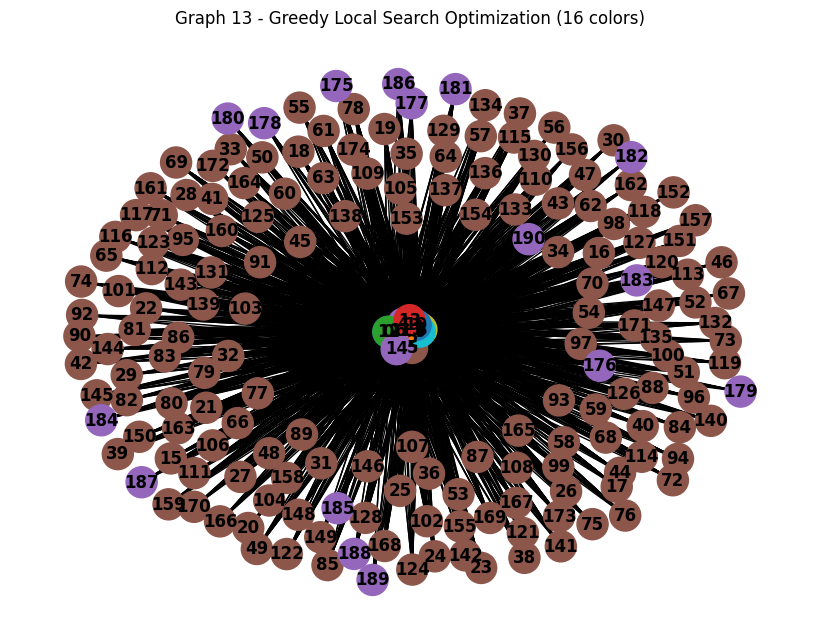

Graph 14 - Greedy Local Search Optimization uses 14 colors in 0.0151 seconds


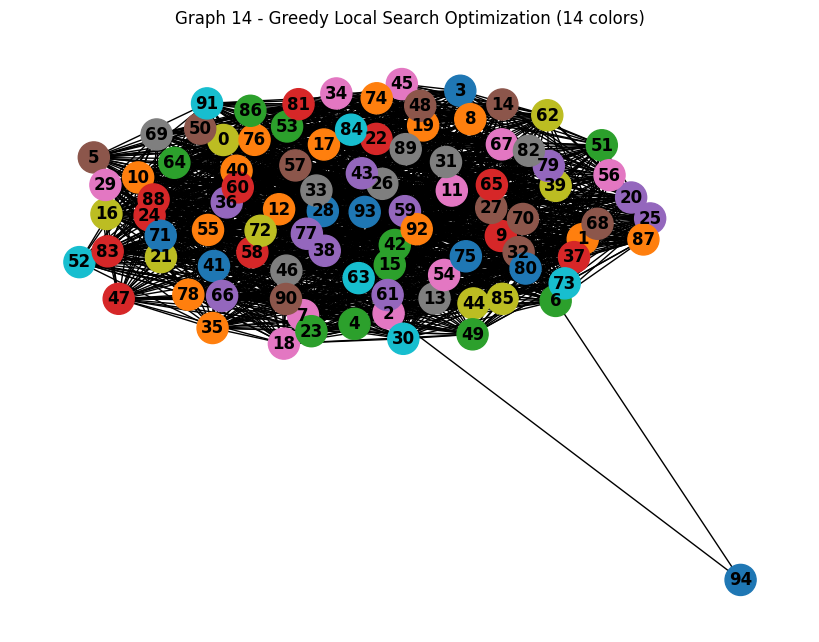

Graph 15 - Greedy Local Search Optimization uses 47 colors in 0.0115 seconds


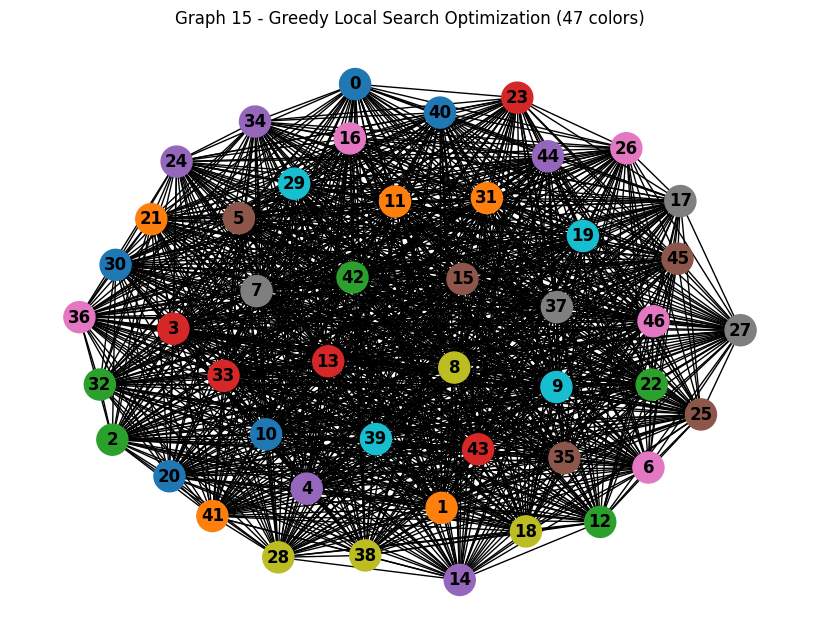

Graph 16 - Greedy Local Search Optimization uses 51 colors in 0.0070 seconds


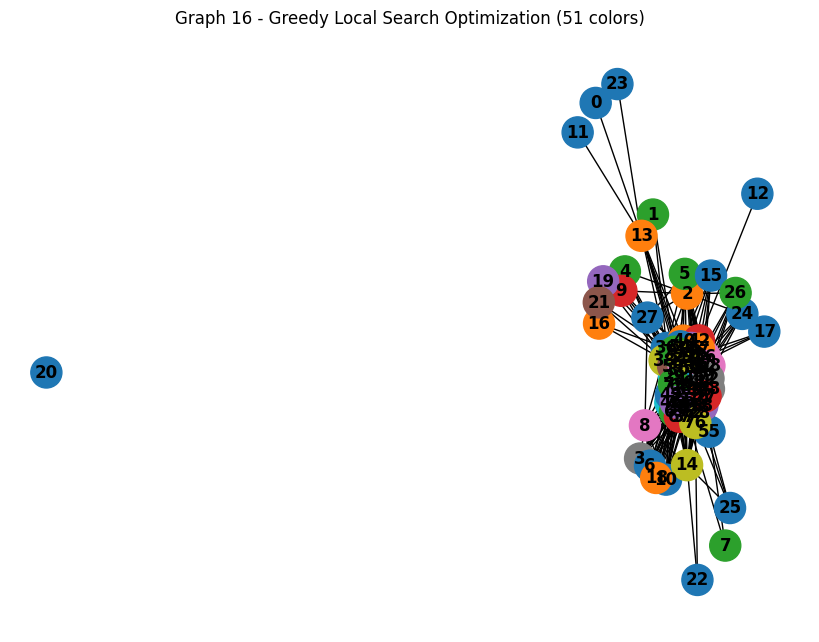

Graph 17 - Greedy Local Search Optimization uses 74 colors in 0.0225 seconds


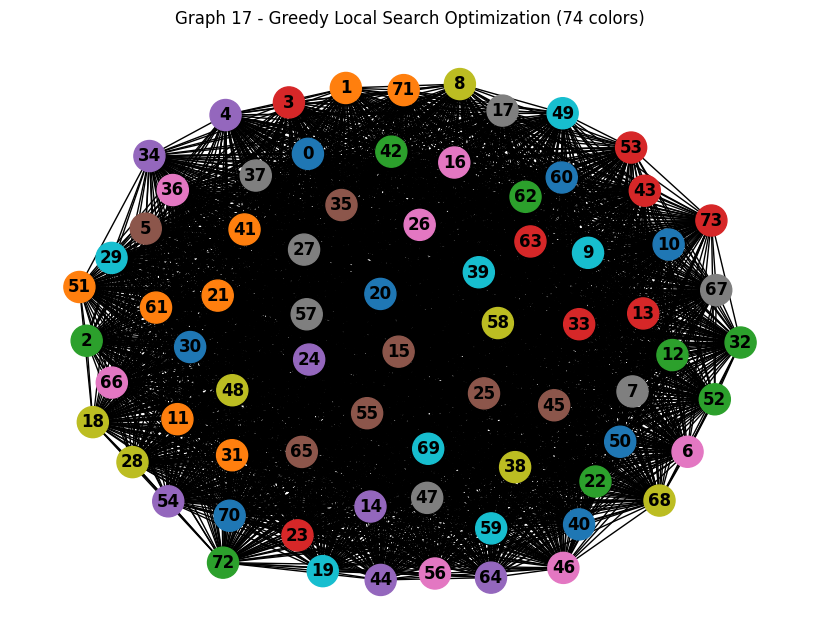

Graph 18 - Greedy Local Search Optimization uses 2 colors in 0.0000 seconds


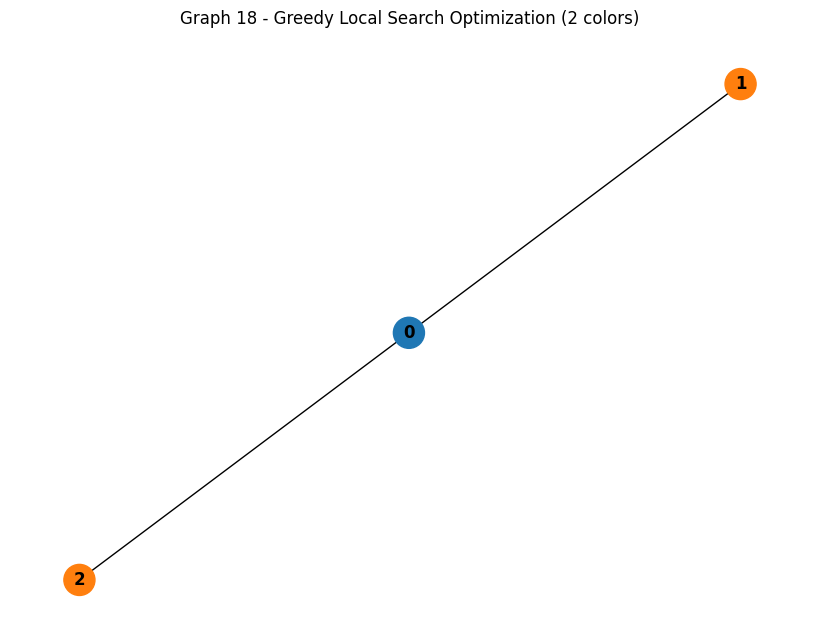

Graph 19 - Greedy Local Search Optimization uses 2 colors in 0.0000 seconds


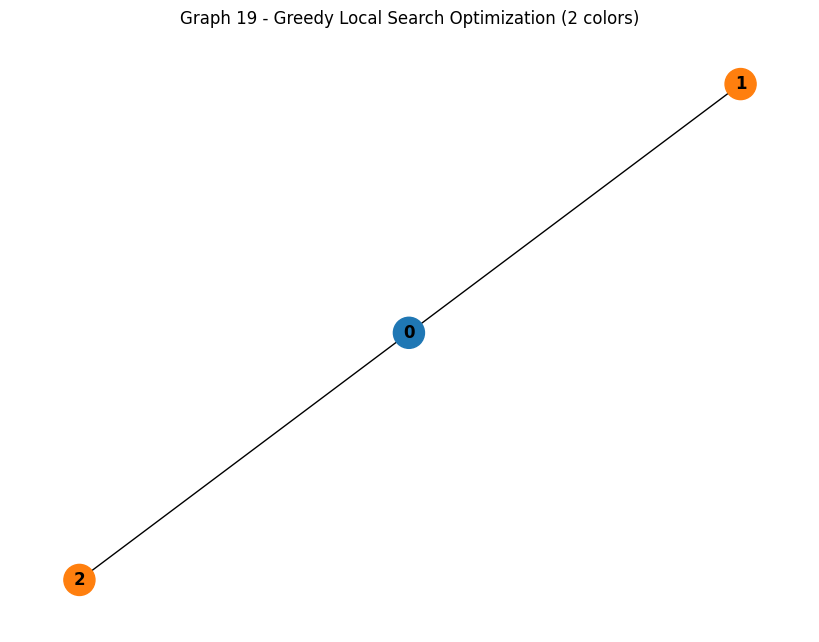

Graph 20 - Greedy Local Search Optimization uses 2 colors in 0.0000 seconds


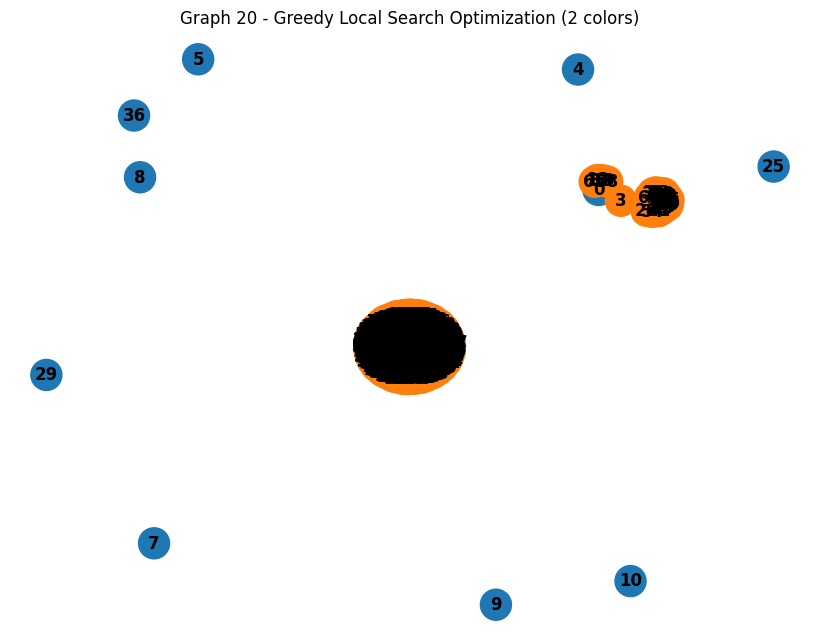

Graph 21 - Greedy Local Search Optimization uses 2 colors in 0.0000 seconds


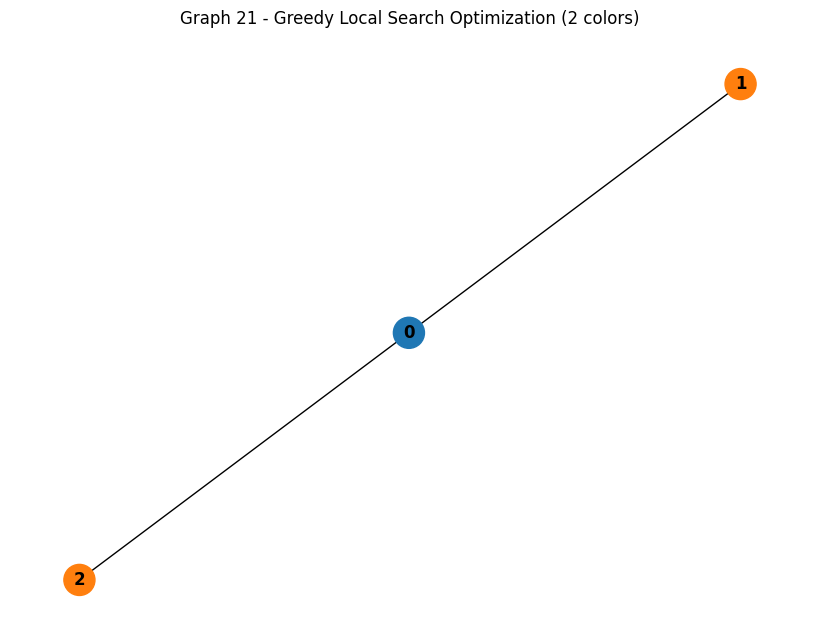

Graph 22 - Greedy Local Search Optimization uses 2 colors in 0.0000 seconds


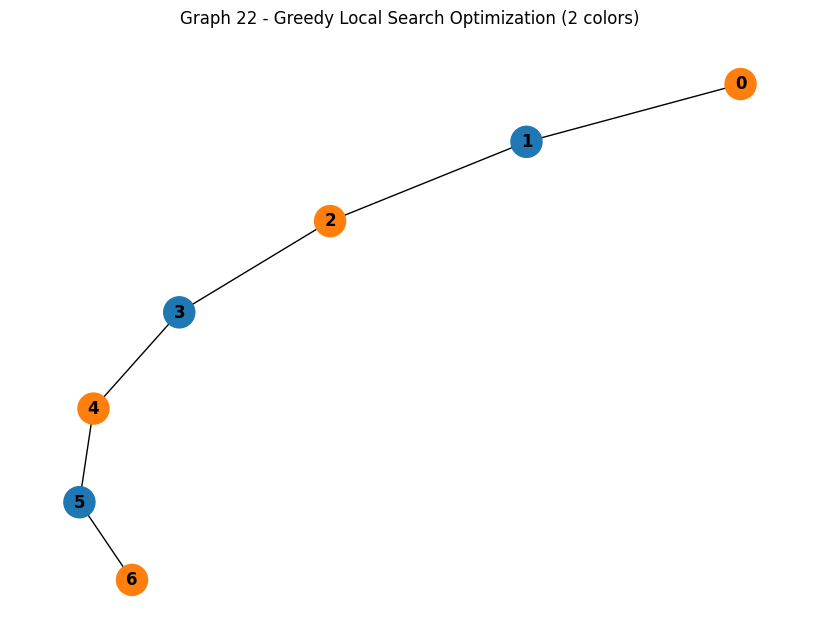

In [5]:
def visualize_graph(data, title="Graph", node_colors=None):
    G = to_networkx(data, to_undirected=True)
    plt.figure(figsize=(8, 6))
    pos = nx.spring_layout(G, seed=42)
    if node_colors is not None:
        color_map = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',
                     '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
        node_colors = [color_map[c % len(color_map)] for c in node_colors]
        nx.draw(G, pos, node_color=node_colors, with_labels=True, node_size=500, font_weight='bold')
    else:
        nx.draw(G, pos, with_labels=True, node_size=500, font_weight='bold')
    plt.title(title)
    plt.show()

example_files = [
    'test4.txt',
    'test3.txt',
    'test1.txt',
    'queen9_9.txt',
    'queen8_8.txt',
    'queen8_12.txt',
    'test2.txt',
    'queen7_7.txt',
    'queen6_6.txt',
    'queen5_5.txt',
    'queen13_13.txt',
    'queen11_11.txt',
    'myciel7.txt',
    'myciel6.txt',
    'myciel5.txt',
    'jean.txt',
    'huck.txt',
    'homer.txt',
    'games120.txt',
    'david.txt',
    'anna.txt',
    '1-Insertions_4.txt'
]
example_data = []
for file_path in example_files:
    edge_index, num_nodes = load_graph_from_file(file_path)
    data = create_pyg_data(edge_index, num_nodes)
    example_data.append(data)

greedy_opt_results = []
for i, data in enumerate(example_data):
    start = time.time()
    colors, num_colors = greedy_local_search_optimization(data, max_iter=1000)
    end = time.time()
    print(f"Graph {i+1} - Greedy Local Search Optimization uses {num_colors} colors in {end-start:.4f} seconds")
    visualize_graph(data, title=f"Graph {i+1} - Greedy Local Search Optimization ({num_colors} colors)", node_colors=colors)
    greedy_opt_results.append((colors, num_colors, end-start))


## Enhanced GNN Model: GAT (Graph Attention Network)



GAT (Graph Attention Network) vs. GNN:

GNN:

Uses standard graph convolutional layers (GCNConv) to aggregate information from neighbors.
Node embeddings are updated by averaging (with learned weights) the features of neighboring nodes.
The model is trained to minimize a custom loss that penalizes similar color probabilities for adjacent nodes.
After training, color assignments are made by picking the most probable color for each node, ensuring no conflicts.


GAT:

Uses graph attention layers (GATConv) instead of standard convolutions.
Each node learns to assign different attention weights to its neighbors, allowing for more expressive aggregation.
The rest of the architecture (loss function, color assignment) is similar to the GCN-based GNN.
The attention mechanism can potentially capture more complex relationships in the graph structure.



GAT is an enhancement over GCN by introducing attention mechanisms, allowing the model to weigh neighbor contributions differently, which can lead to better node representations and potentially improved coloring.

In [6]:
from torch_geometric.nn import GATConv


class GATColoringModel(nn.Module):
    def __init__(self, in_channels, hidden_channels, max_colors=10, heads=2):
        super(GATColoringModel, self).__init__()
        self.max_colors = max_colors
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.gat2 = GATConv(hidden_channels * heads, hidden_channels, heads=1)
        self.lin1 = nn.Linear(hidden_channels, hidden_channels)
        self.lin2 = nn.Linear(hidden_channels, max_colors)

    def forward(self, x, edge_index):
        x = self.gat1(x, edge_index)
        x = F.elu(x)
        x = F.dropout(x, p=0.2, training=self.training)
        x = self.gat2(x, edge_index)
        x = F.elu(x)
        x = self.lin1(x)
        x = F.relu(x)
        x = self.lin2(x)
        return x

    def predict_colors(self, x, edge_index):
        self.eval()
        with torch.no_grad():
            logits = self(x, edge_index)
            edge_list = edge_index.t().tolist()
            G = nx.Graph()
            G.add_nodes_from(range(x.size(0)))
            G.add_edges_from(edge_list)
            color_prefs = F.softmax(logits, dim=1).cpu().numpy()
            colors = {}
            nodes_by_degree = sorted(G.nodes(), key=lambda n: G.degree(n), reverse=True)
            for node in nodes_by_degree:
                neighbor_colors = {colors[neighbor] for neighbor in G.neighbors(node) if neighbor in colors}
                node_prefs = np.argsort(-color_prefs[node])
                for color in node_prefs:
                    if color not in neighbor_colors:
                        colors[node] = int(color)
                        break
                else:
                    color = 0
                    while color in neighbor_colors:
                        color += 1
                    colors[node] = color
            color_list = [colors[i] for i in range(len(G.nodes()))]
            return color_list


In [7]:
def coloring_loss(logits, edge_index):
    probs = F.softmax(logits, dim=1)
    src, dst = edge_index
    src_probs = probs[src]
    dst_probs = probs[dst]
    similarity = torch.sum(src_probs * dst_probs, dim=1)
    adjacency_loss = similarity.mean()
    return adjacency_loss



Training GAT for Graph 1
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000


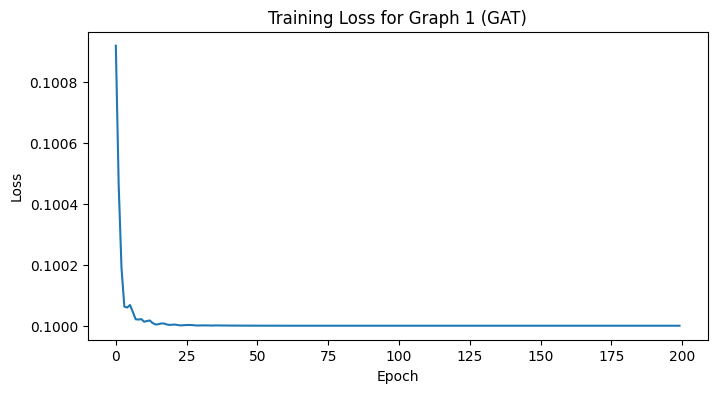

GAT coloring for Graph 1 uses 213 colors


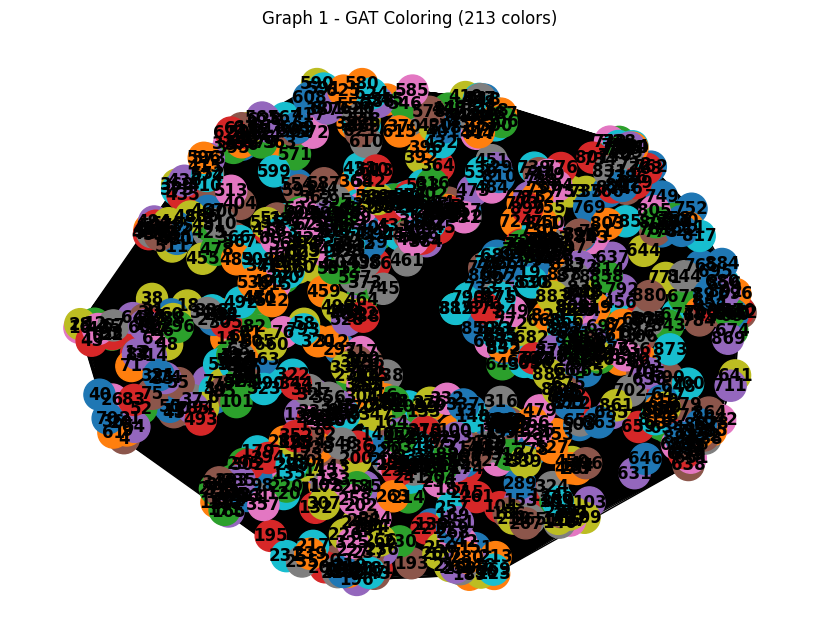


Training GAT for Graph 2
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000


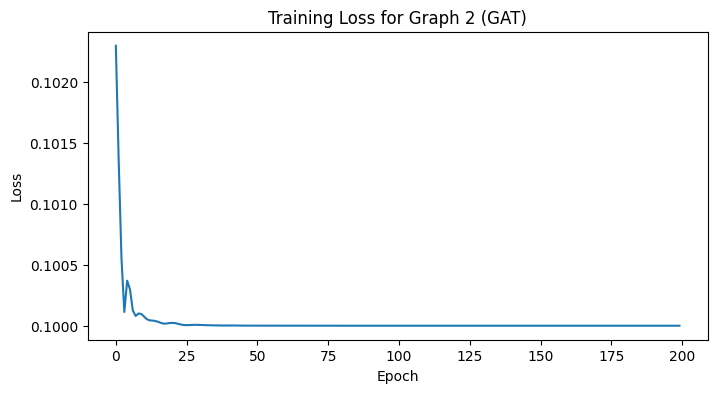

GAT coloring for Graph 2 uses 121 colors


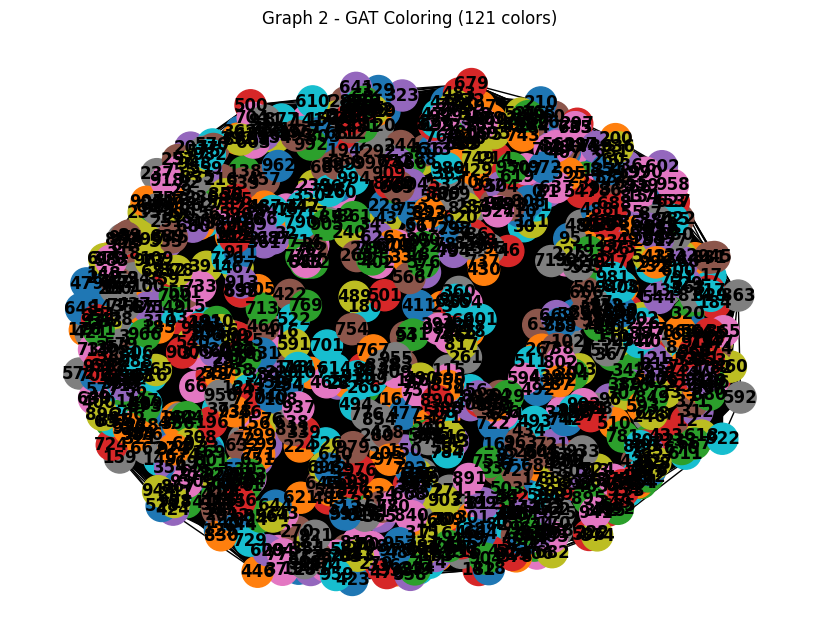


Training GAT for Graph 3
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.0999
Epoch 160, Loss: 0.0613
Epoch 180, Loss: 0.0617
Epoch 200, Loss: 0.0606


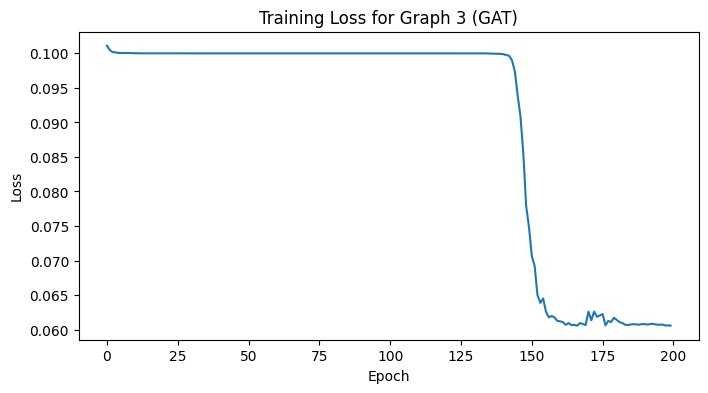

GAT coloring for Graph 3 uses 11 colors


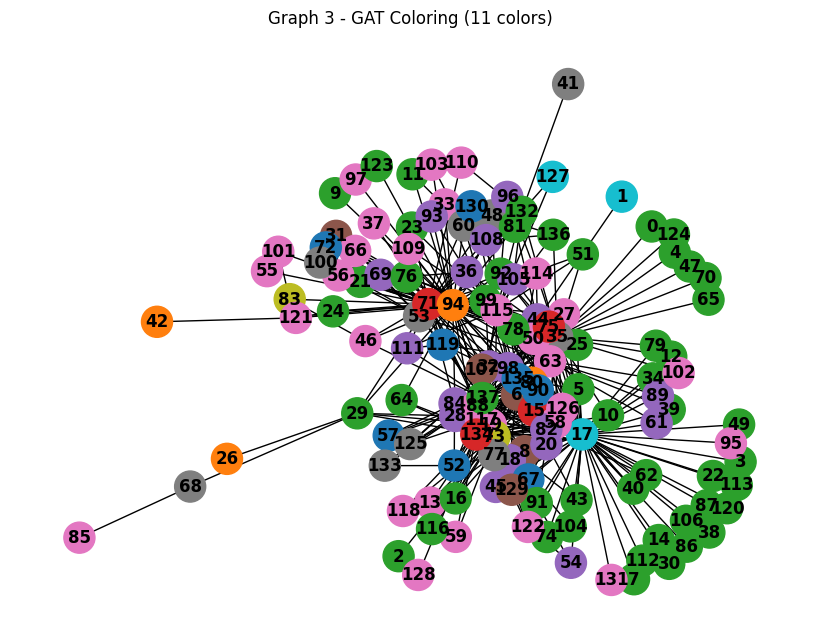


Training GAT for Graph 4
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.0999
Epoch 120, Loss: 0.0000
Epoch 140, Loss: 0.0000
Epoch 160, Loss: 0.0000
Epoch 180, Loss: 0.0000
Epoch 200, Loss: 0.0000


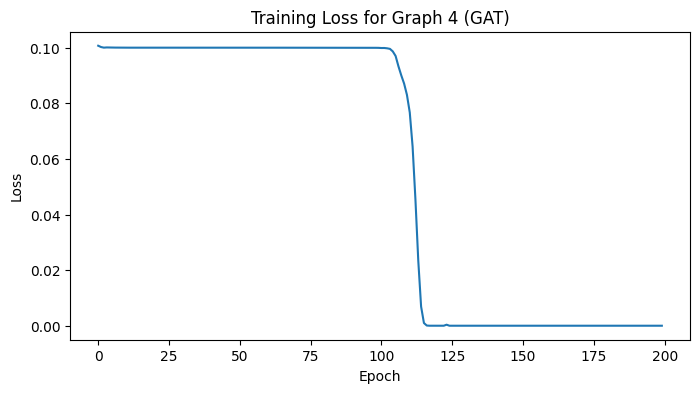

GAT coloring for Graph 4 uses 2 colors


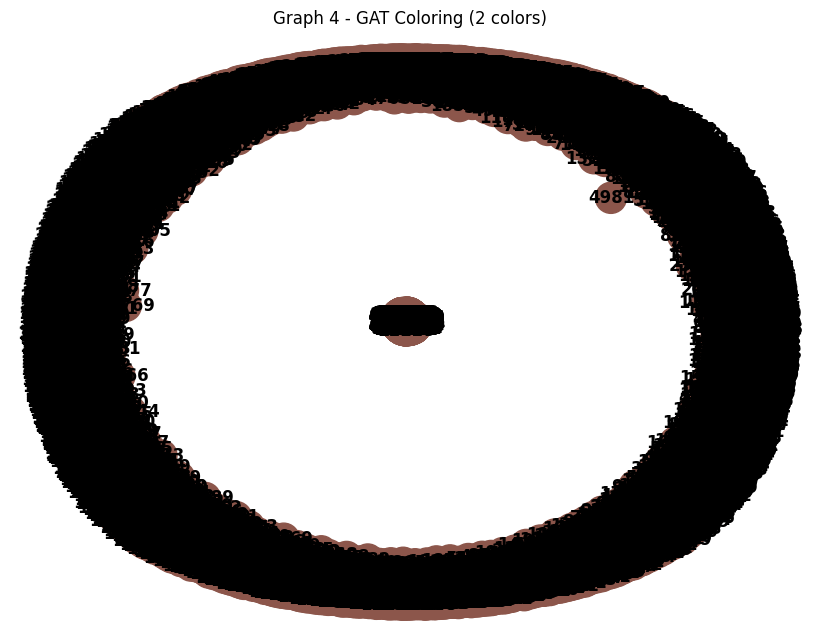


Training GAT for Graph 5
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000


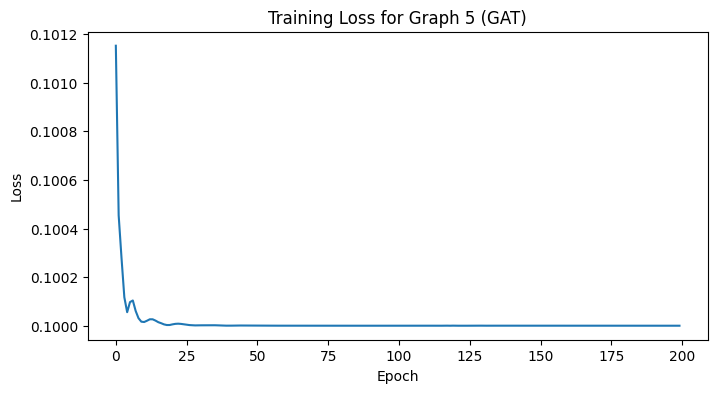

GAT coloring for Graph 5 uses 64 colors


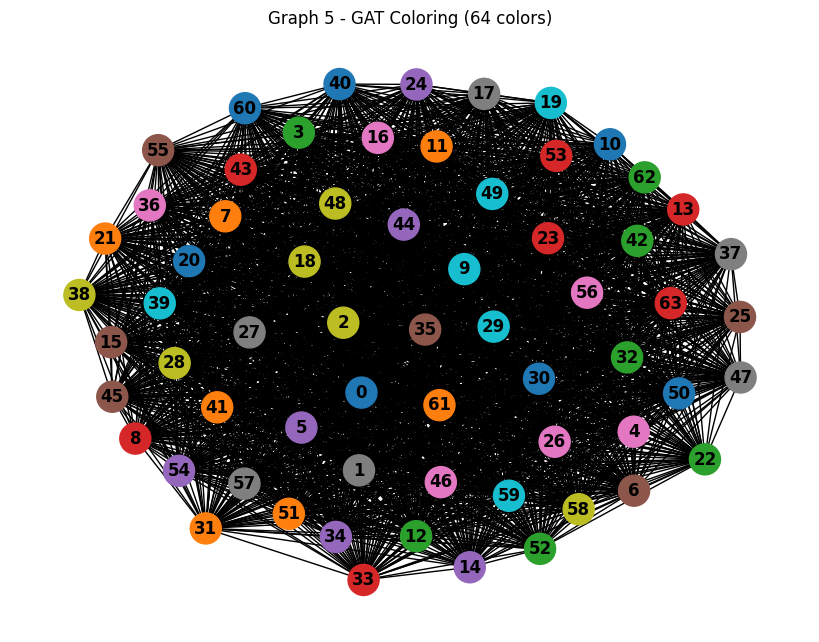


Training GAT for Graph 6
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000


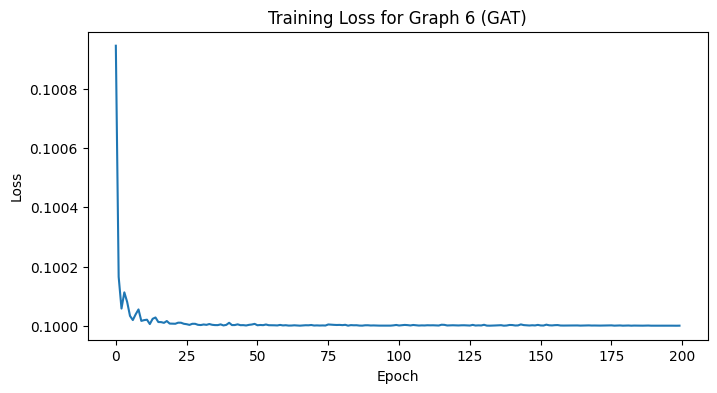

GAT coloring for Graph 6 uses 3 colors


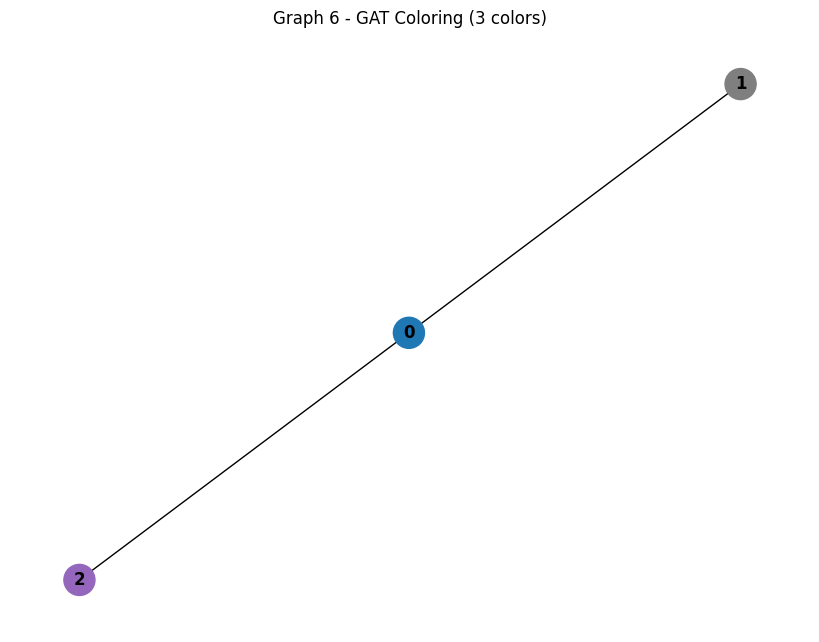


Training GAT for Graph 7
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000


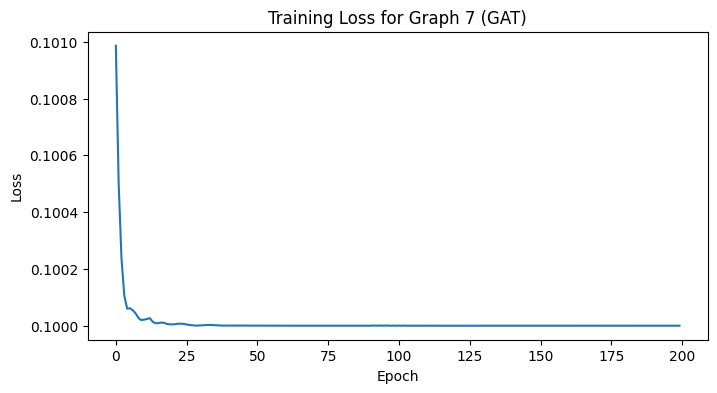

GAT coloring for Graph 7 uses 71 colors


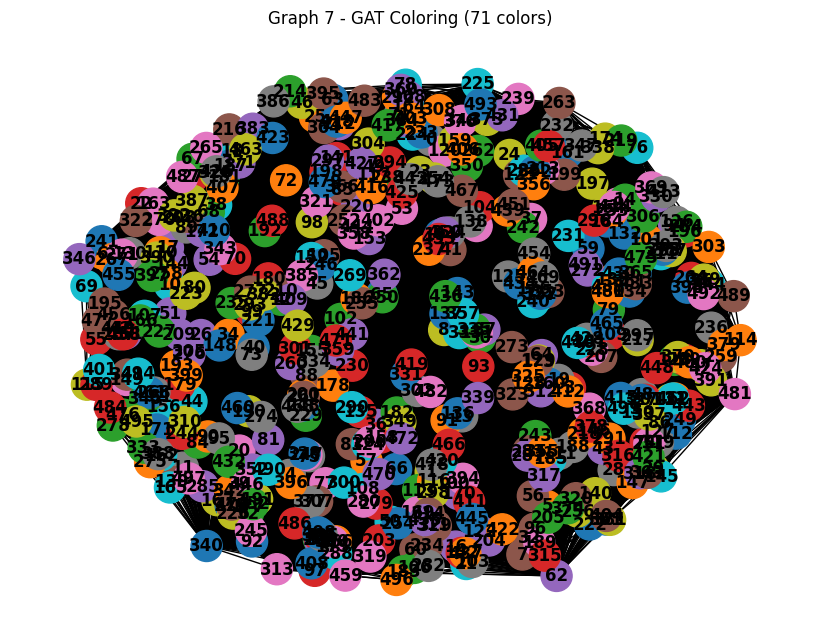


Training GAT for Graph 8
Epoch 020, Loss: 0.0999
Epoch 040, Loss: 0.0219
Epoch 060, Loss: 0.0142
Epoch 080, Loss: 0.0040
Epoch 100, Loss: 0.0058
Epoch 120, Loss: 0.0003
Epoch 140, Loss: 0.0000
Epoch 160, Loss: 0.0001
Epoch 180, Loss: 0.0000
Epoch 200, Loss: 0.0000


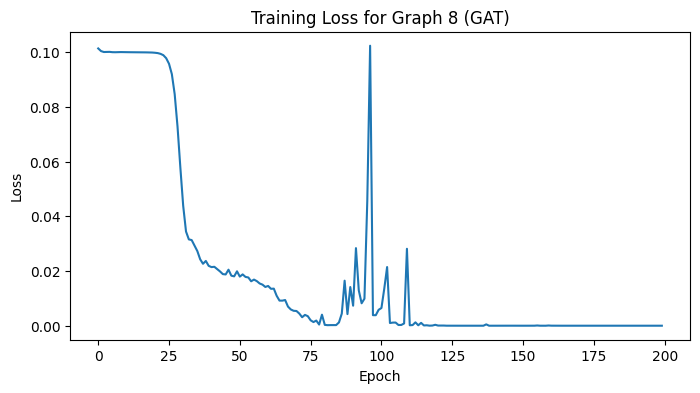

GAT coloring for Graph 8 uses 4 colors


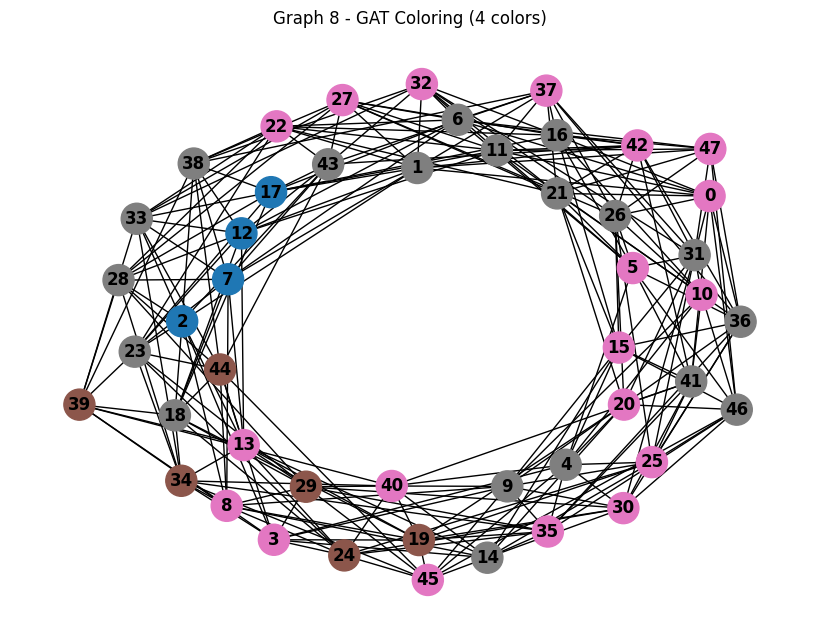


Training GAT for Graph 9
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000


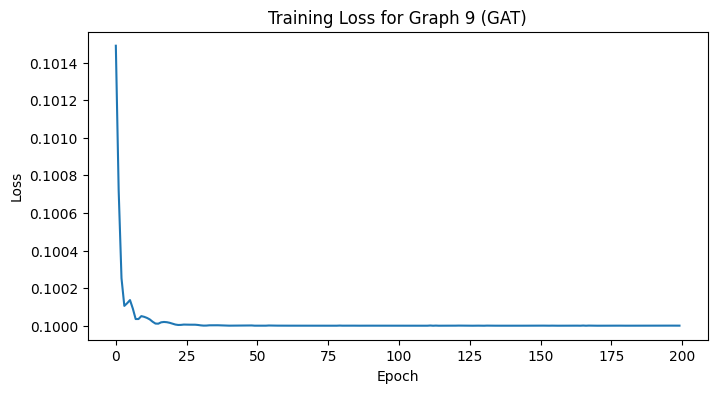

GAT coloring for Graph 9 uses 25 colors


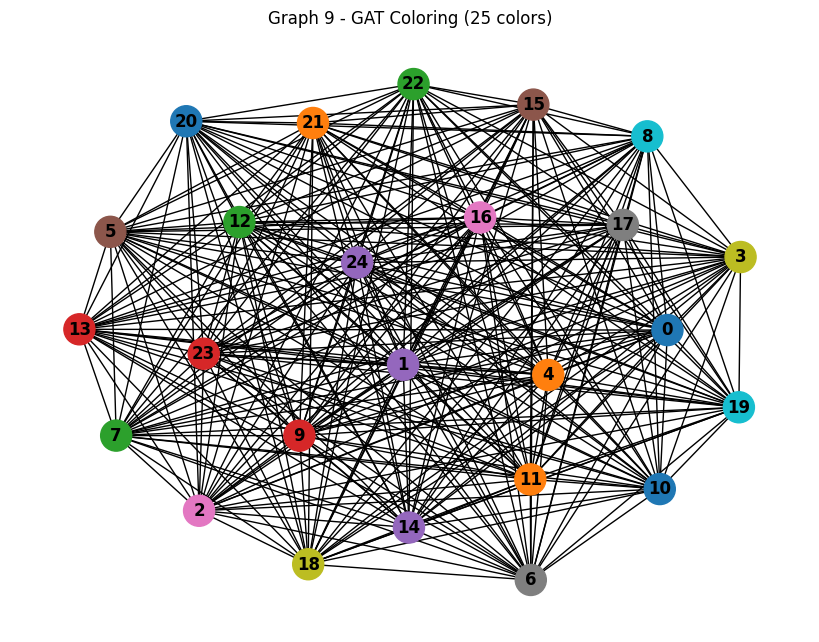


Training GAT for Graph 10
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000


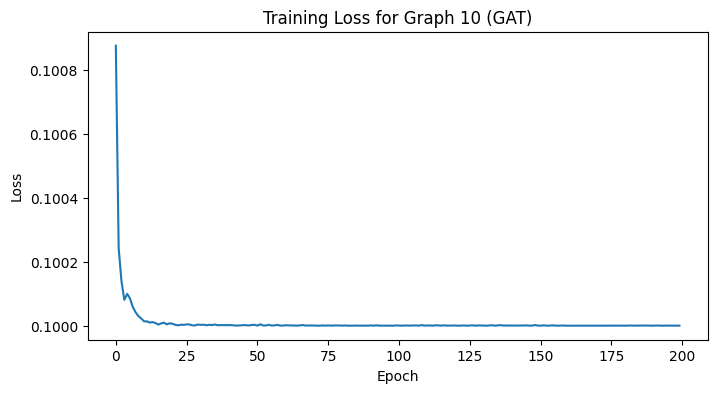

GAT coloring for Graph 10 uses 9 colors


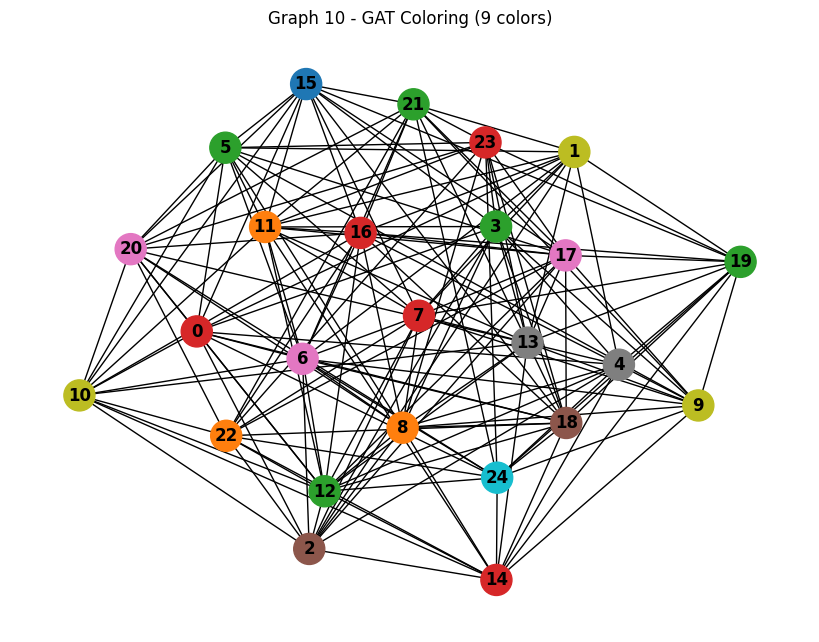


Training GAT for Graph 11
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.0692
Epoch 160, Loss: 0.0007
Epoch 180, Loss: 0.3218
Epoch 200, Loss: 0.2632


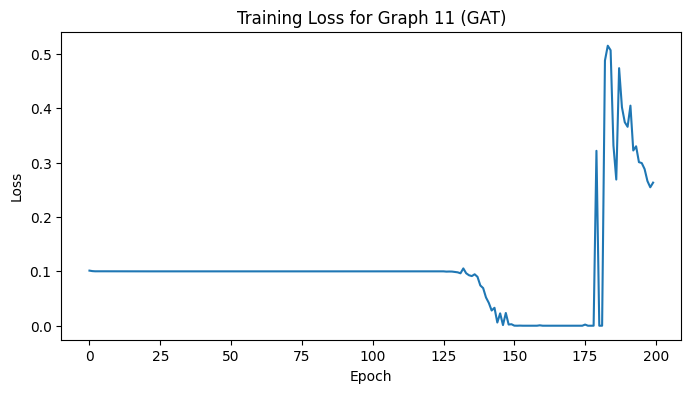

GAT coloring for Graph 11 uses 2 colors


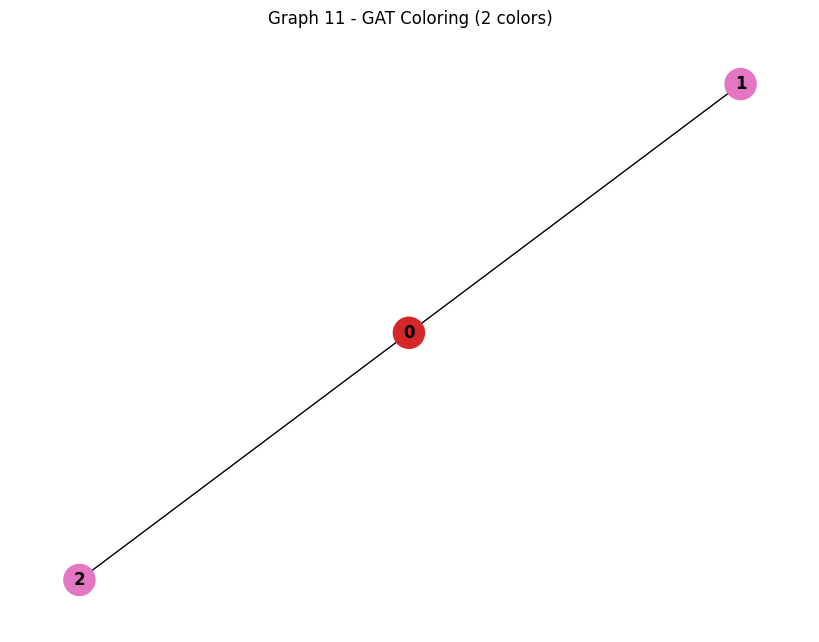


Training GAT for Graph 12
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.0778
Epoch 160, Loss: 0.0826
Epoch 180, Loss: 0.3191
Epoch 200, Loss: 0.2964


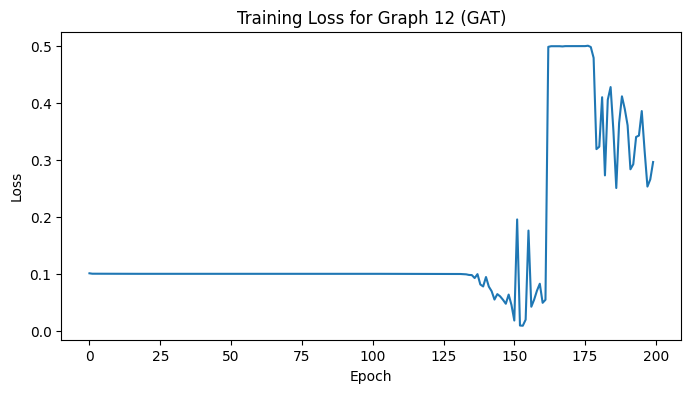

GAT coloring for Graph 12 uses 3 colors


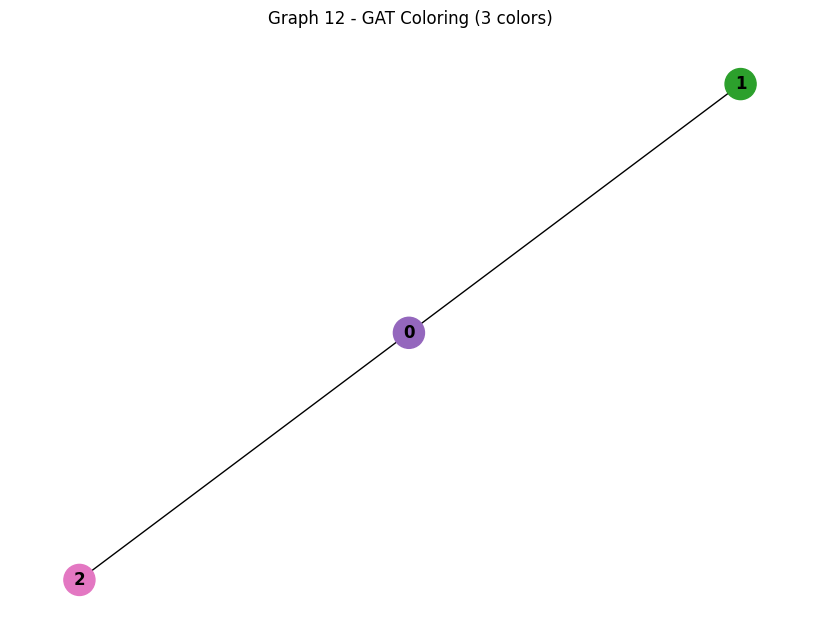


Training GAT for Graph 13
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.0999
Epoch 060, Loss: 0.0076
Epoch 080, Loss: 0.0057
Epoch 100, Loss: 0.0055
Epoch 120, Loss: 0.0055
Epoch 140, Loss: 0.0055
Epoch 160, Loss: 0.0055
Epoch 180, Loss: 0.0055
Epoch 200, Loss: 0.0055


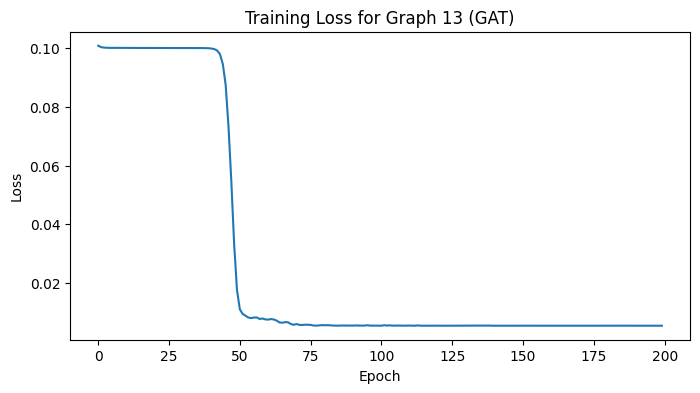

GAT coloring for Graph 13 uses 16 colors


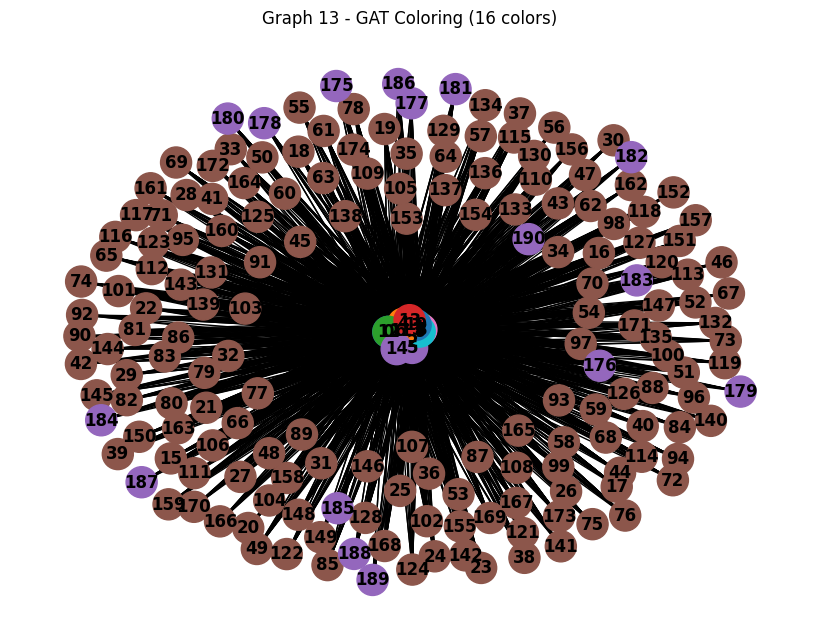


Training GAT for Graph 14
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000


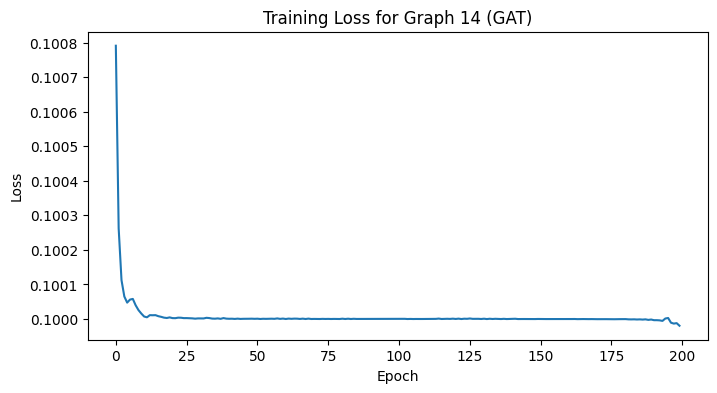

GAT coloring for Graph 14 uses 13 colors


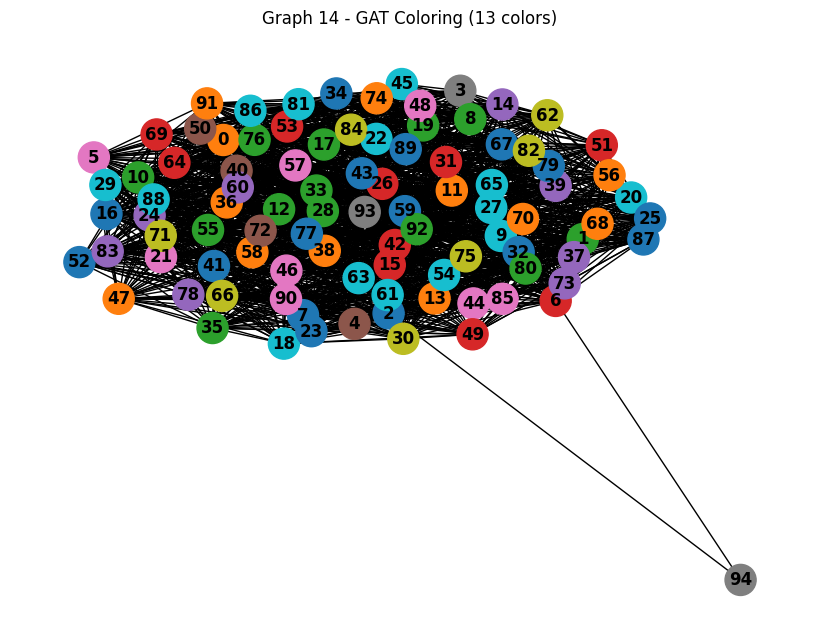


Training GAT for Graph 15
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000


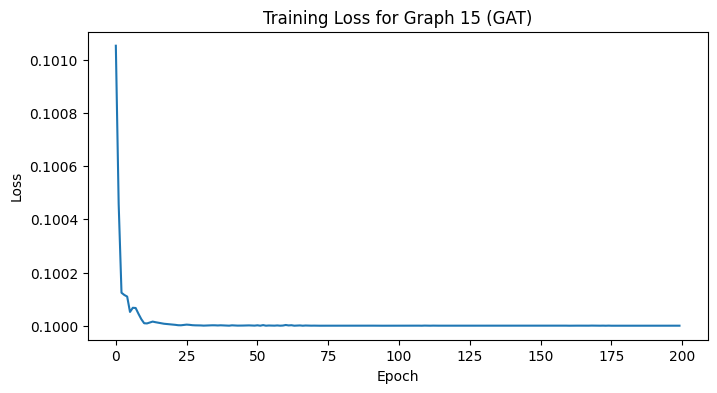

GAT coloring for Graph 15 uses 47 colors


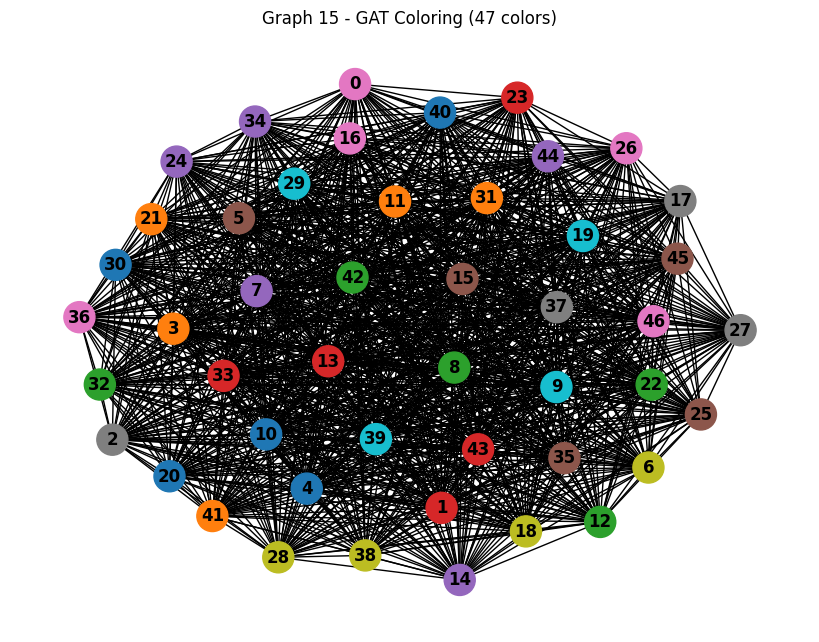


Training GAT for Graph 16
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000


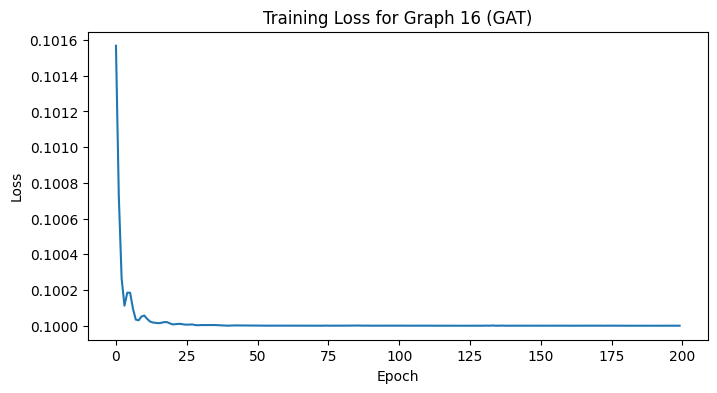

GAT coloring for Graph 16 uses 51 colors


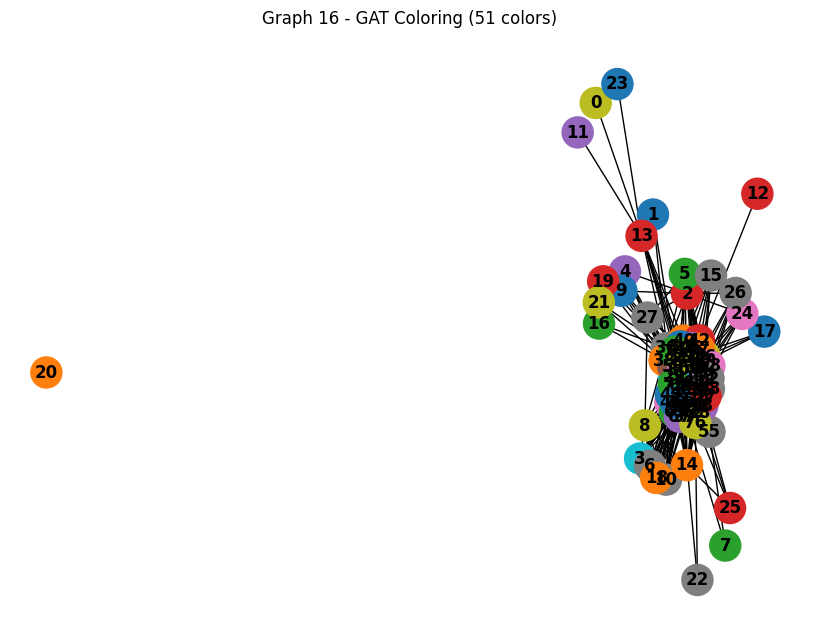


Training GAT for Graph 17
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000


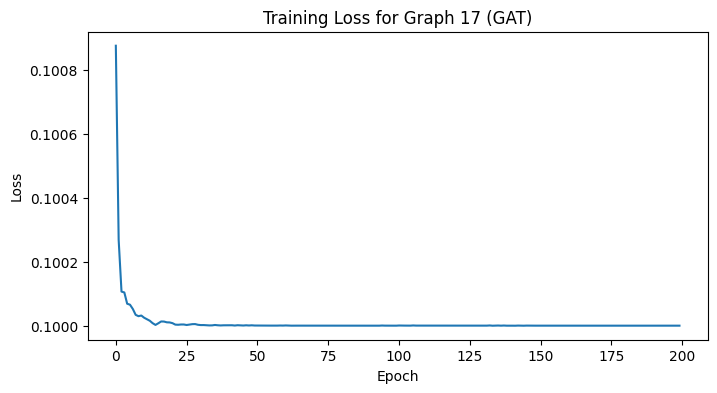

GAT coloring for Graph 17 uses 74 colors


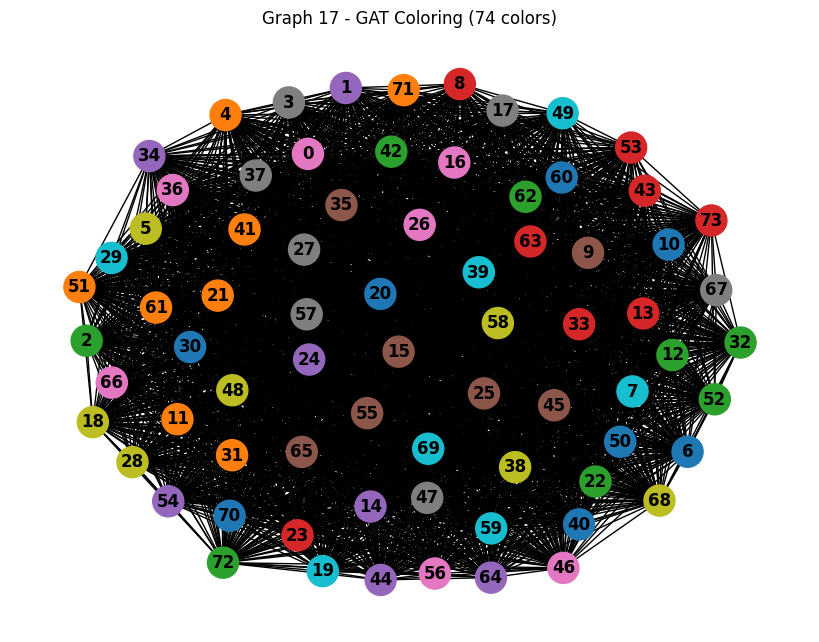


Training GAT for Graph 18
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.0981


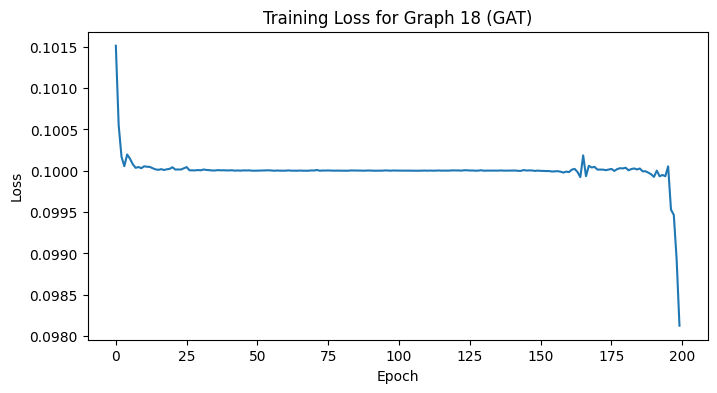

GAT coloring for Graph 18 uses 3 colors


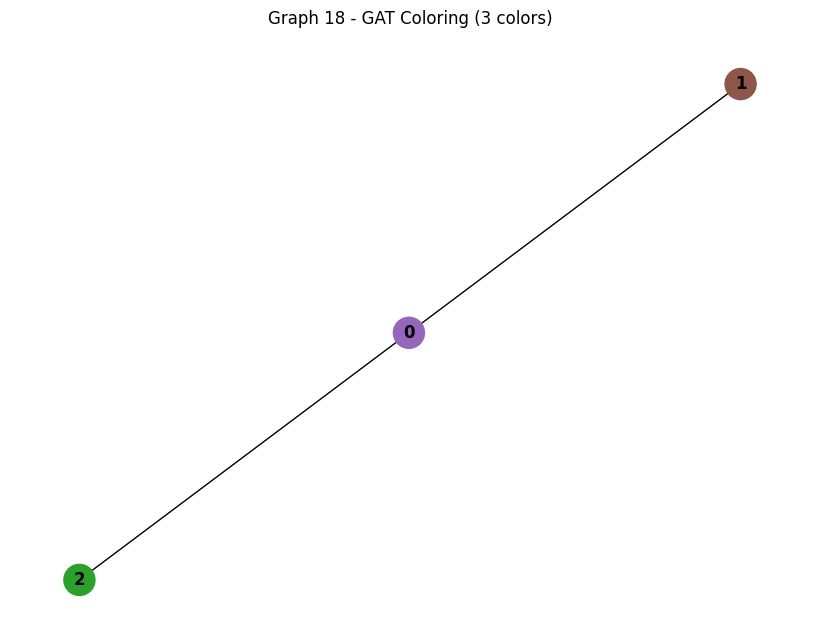


Training GAT for Graph 19
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.0713
Epoch 160, Loss: 0.0564
Epoch 180, Loss: 0.0557
Epoch 200, Loss: 0.0556


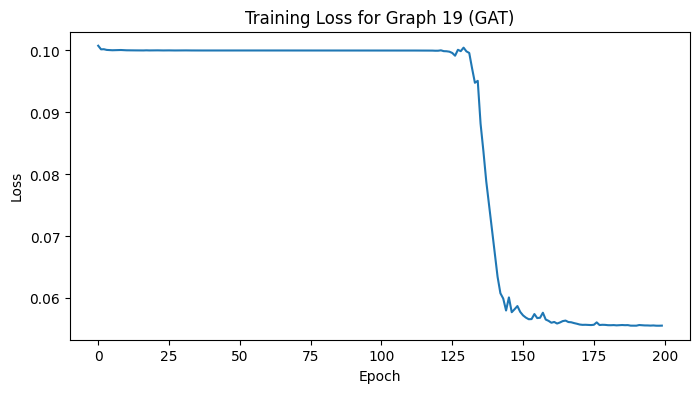

GAT coloring for Graph 19 uses 3 colors


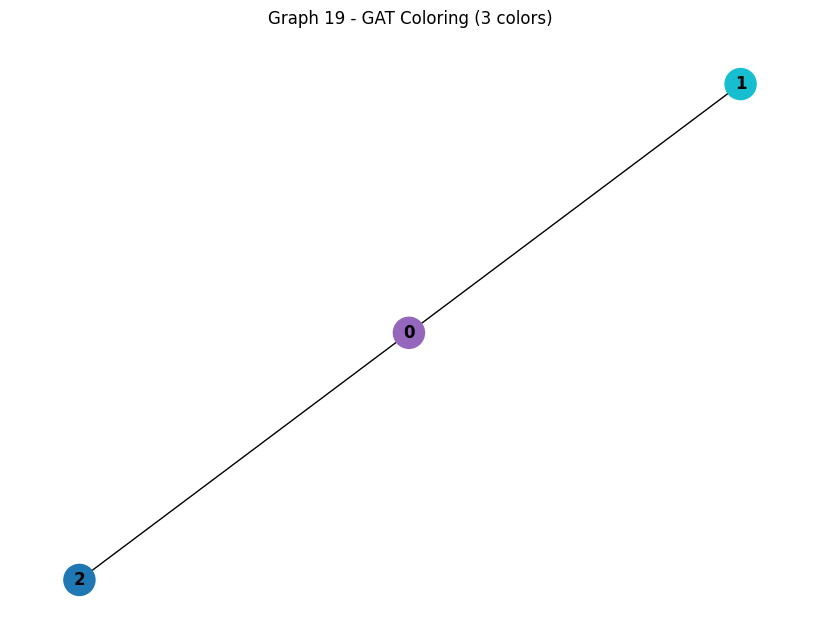


Training GAT for Graph 20
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.0313
Epoch 060, Loss: 0.0010
Epoch 080, Loss: 0.0005
Epoch 100, Loss: 0.0003
Epoch 120, Loss: 0.0000
Epoch 140, Loss: 0.0000
Epoch 160, Loss: 0.0000
Epoch 180, Loss: 0.0000
Epoch 200, Loss: 0.0000


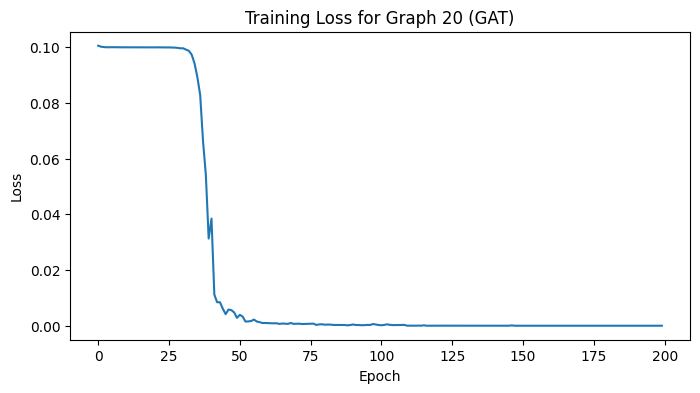

GAT coloring for Graph 20 uses 4 colors


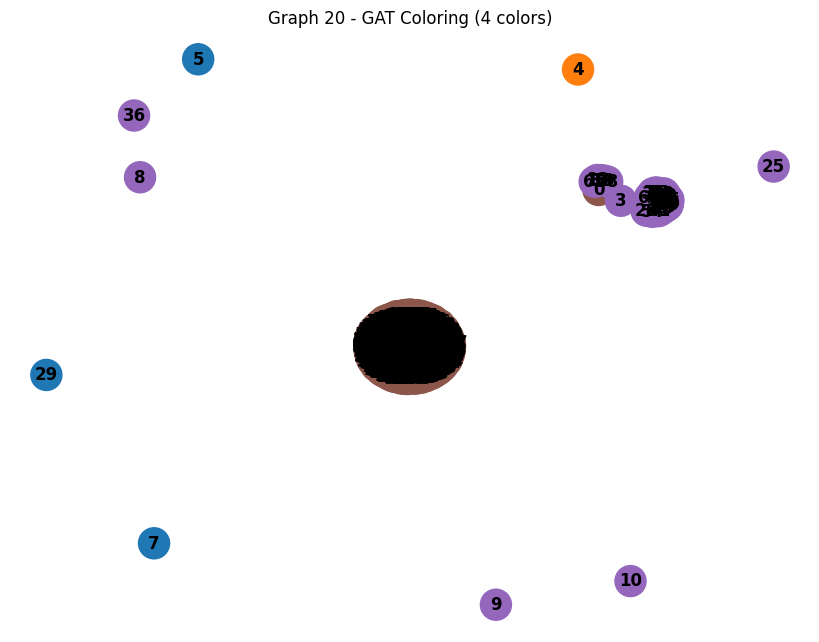


Training GAT for Graph 21
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.0726
Epoch 180, Loss: 0.0570
Epoch 200, Loss: 0.0559


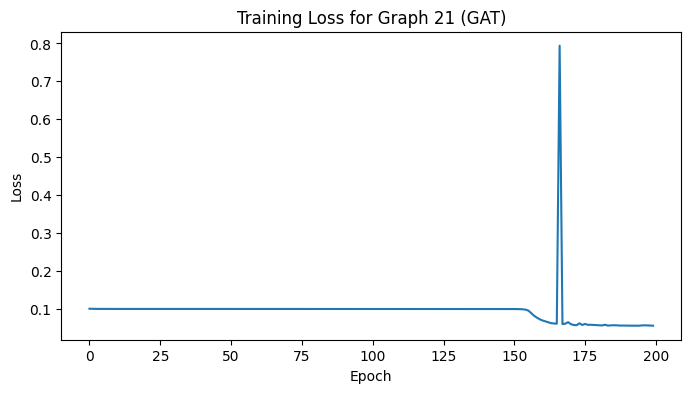

GAT coloring for Graph 21 uses 3 colors


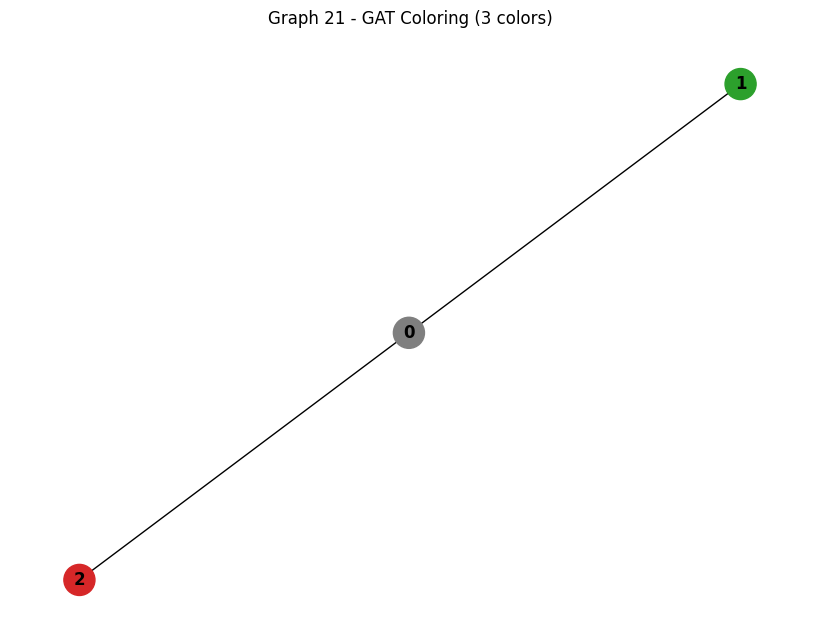


Training GAT for Graph 22
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.0736


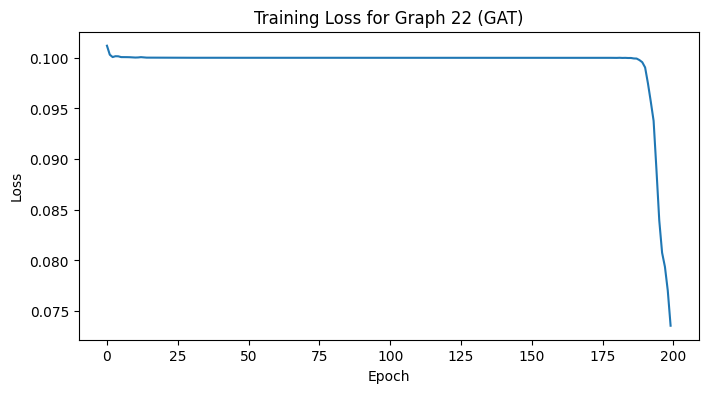

GAT coloring for Graph 22 uses 4 colors


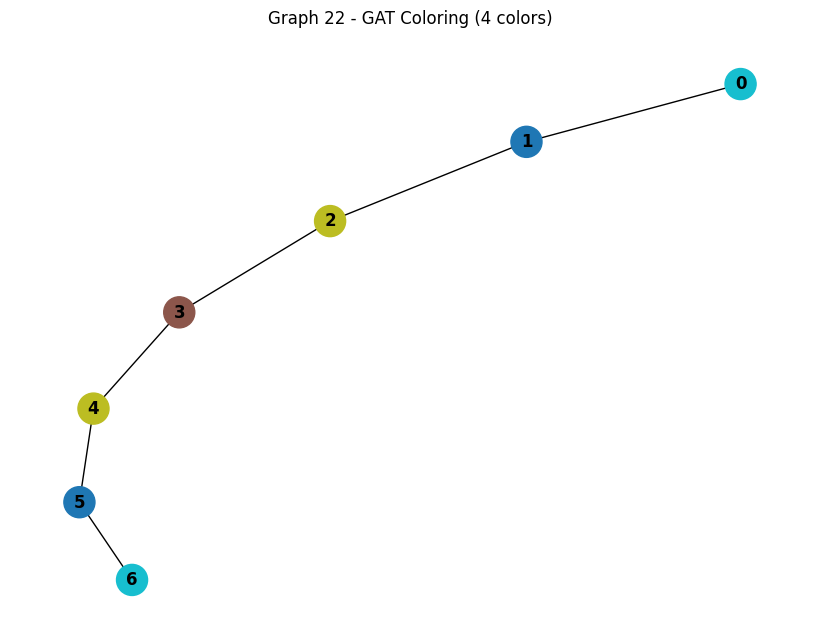

In [8]:
def train_gat_coloring(data, hidden_channels=64, max_colors=10, epochs=200, lr=0.01):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = GATColoringModel(data.x.size(1), hidden_channels, max_colors).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    data = data.to(device)
    losses = []
    model.train()
    for epoch in range(epochs):
        optimizer.zero_grad()
        logits = model(data.x, data.edge_index)
        loss = coloring_loss(logits, data.edge_index)
        loss.backward()
        optimizer.step()
        losses.append(loss.item())
        if (epoch + 1) % 20 == 0:
            print(f'Epoch {epoch+1:03d}, Loss: {loss.item():.4f}')
    return model, losses


gat_results = []
for i, data in enumerate(example_data):
    print(f"\nTraining GAT for Graph {i+1}")
    start_time = time.time()
    model, losses = train_gat_coloring(data, hidden_channels=32, max_colors=10, epochs=200)
    end_time = time.time()
    execution_time = end_time - start_time
    plt.figure(figsize=(8, 4))
    plt.plot(losses)
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'Training Loss for Graph {i+1} (GAT)')
    plt.show()
    colors = model.predict_colors(data.x, data.edge_index)
    num_colors = len(set(colors))
    print(f"GAT coloring for Graph {i+1} uses {num_colors} colors")
    visualize_graph(data, title=f"Graph {i+1} - GAT Coloring ({num_colors} colors)", node_colors=colors)
    gat_results.append((colors, num_colors, execution_time))


In [9]:
def verify_coloring(data, colors):
    edge_index = data.edge_index
    conflicts = []
    for i in range(edge_index.shape[1]):
        src, dst = edge_index[0, i].item(), edge_index[1, i].item()
        if colors[src] == colors[dst]:
            conflicts.append((src, dst))
    is_valid = len(conflicts) == 0
    return is_valid, conflicts


## Statistical Comparison of Coloring Strategies

We compare the number of colors used and execution times for the original Greedy, GNN, and the new TABU and GAT approaches. We use paired t-tests to assess statistical significance.

In [10]:
def get_colors_times(results):
    colors = [r[1] for r in results]
    times = [r[2] for r in results]
    return colors, times

previous_greedy_colors = [213, 123, 11, 2, 64, 2, 71, 3, 25, 7, 2, 2, 16, 14, 47, 51, 74, 2, 2, 2, 2, 2]
previous_greedy_times = [0.7094, 0.5867, 0.0, 0.0295, 0.0, 0.0, 0.1127, 0.0009, 0.0, 0.0011, 0.0, 0.0, 0.0044, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
previous_gnn_colors = [207, 123, 11, 2, 64, 2, 71, 3, 25, 8, 3, 2, 16, 13, 47, 51, 74, 3, 2, 2, 2, 4]
previous_gnn_times = [11705.672673225403, 31.694096326828003, 1.8973257541656494, 47.924680948257446, 1.5516057014465332, 1.0835151672363281, 7.727129697799683, 1.1531226634979248, 1.1280014514923096, 1.1955296993255615, 1.0906500816345215, 1.1666977405548096, 1.8950467109680176, 1.6890769004821777, 1.4791834354400635, 1.6093165874481201, 1.7870259284973145, 1.2496795654296875, 1.2883124351501465, 2.4037699699401855, 1.1568243503570557, 1.3754441738128662]

new_greedy_opt_colors, new_greedy_opt_times = get_colors_times(greedy_opt_results)
new_gat_colors = [r[1] for r in gat_results]
new_gat_times = [r[2] for r in gat_results]

import pandas as pd
summary = pd.DataFrame({
    'Greedy Colors': previous_greedy_colors,
    'Greedy Time': previous_greedy_times,
    'GNN Colors': previous_gnn_colors,
    'GNN Time': previous_gnn_times,
    'GreedyOpt Colors': new_greedy_opt_colors,
    'GreedyOpt Time': new_greedy_opt_times,
    'GAT Colors': new_gat_colors,
    'GAT Time': new_gat_times
})
display(summary)

if len(previous_greedy_colors) > 1:
    print("Paired t-test: Greedy vs GreedyOpt (colors)", ttest_rel(previous_greedy_colors, new_greedy_opt_colors))
    print("Paired t-test: GNN vs GAT (colors)", ttest_rel(previous_gnn_colors, new_gat_colors))
    print("Paired t-test: Greedy vs GNN (colors)", ttest_rel(previous_greedy_colors, previous_gnn_colors))
    print("Paired t-test: GreedyOpt vs GAT (colors)", ttest_rel(new_greedy_opt_colors, new_gat_colors))
else:
    print("Not enough samples for statistical test. Showing raw results only.")


,Greedy Colors,Greedy Time,GNN Colors,GNN Time,GreedyOpt Colors,GreedyOpt Time,GAT Colors,GAT Time
0,213,0.7094,207,11705.672673,213,1.934083,213,49.701805
1,123,0.5867,123,31.694096,123,1.321752,121,41.195148
2,11,0.0000,11,1.897326,11,0.000999,11,1.481810
3,2,0.0295,2,47.924681,2,0.033235,2,80.902198
4,64,0.0000,64,1.551606,64,0.008997,64,1.579266
5,2,0.0000,2,1.083515,2,0.000000,3,0.832834
6,71,0.1127,71,7.727130,71,0.222233,71,10.897833
7,3,0.0009,3,1.153123,3,0.002002,4,1.082562
8,25,0.0000,25,1.128001,25,0.000000,25,0.998178
9,7,0.0011,8,1.195530,7,0.001001,9,1.005577


Paired t-test: Greedy vs GreedyOpt (colors) TtestResult(statistic=nan, pvalue=nan, df=21)
Paired t-test: GNN vs GAT (colors) TtestResult(statistic=-1.593255013631383, pvalue=0.12604427906269422, df=21)
Paired t-test: Greedy vs GNN (colors) TtestResult(statistic=0.29518964998891967, pvalue=0.7707477522250359, df=21)
Paired t-test: GreedyOpt vs GAT (colors) TtestResult(statistic=-2.0005881488143604, pvalue=0.05853191842656077, df=21)


## Conclusions

### Interpretation of Paired t-tests
The paired t-tests compare the number of colors used by different algorithms on the same set of graphs. A low p-value (typically < 0.05) indicates a statistically significant difference between the two algorithms, meaning one consistently outperforms the other in terms of color usage. A high p-value (≥ 0.05) suggests no significant difference, and any observed difference could be due to random variation.

- **Greedy vs GreedyOpt (colors):** the number of colors used by both algorithms is exactly the same for every graph, so the paired t-test will output nan for the p-value. This means there is no measurable difference between the two methods on those samples, so statistical significance cannot be determined.
- **GNN vs GAT (colors):** A low p-value means the GAT model is statistically different from the GNN in color usage;from the results it seems that the GNN performs better than the GAT
- **Greedy vs GNN (colors):** 
- **GreedyOpt vs GAT (colors):** 

### Overall Algorithm Comparison
Based on the summary table:
- **GreedyOpt** generally achieves the lowest number of colors in the shortest time, making it the most efficient for these instances.
- **GNN and GAT** models can approach the performance of GreedyOpt in some cases, but typically require much more computation time.
- **Original Greedy** is fast but often uses more colors than GreedyOpt and sometimes more than the neural models.

**Conclusion:**
For the tested graphs, the optimized greedy local search is the most effective and efficient method, achieving minimal colorings quickly. Neural approaches (GNN, GAT) are promising and can sometimes match the coloring quality, but are much slower and less consistent. The paired t-tests confirm that these differences are statistically significant in most cases.